# Komórka 1 - Dzielenie i wczytywanie sygnałów

In [3]:
# Komórka 1 - Dzielenie i wczytywanie sygnałów:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy import signal
import warnings

plt.rcParams["figure.figsize"] = (10, 4)

BASELINE_LEN_S   = 0.5   # ile sekund na początku używamy do estymacji "tła"
SMOOTH_LEN_S     = 0.05  # okno wygładzania [s]
STD_THRESHOLD    = 3.0   # ile odchyleń ponad tło traktujemy jako "start"
DELAY_AFTER_JUMP = 1.0   # ile sekund po skoku zaczynamy ustaloną pracę
WINDOW_LEN_S     = 12.0  # długość okna ustalonej pracy [s]

LSB_TO_G = 0.0039

# Zakładamy, że notebook jest w katalogu: Core/Python
BASE = Path(".")

# Mapowanie: stan śmigła -> katalog z danymi
CONDITION_DIRS = {
    "nieuszkodzone": "fabryczne_nieuszkodzone",
    "uszkodzone":    "fabryczne_uszkodzone",
}

PWM_DIRS = ["pwm_20%", "pwm_30%", "pwm_40%", "pwm_50%"]


def load_data_from_csv(path):
    """Wczytaj t, X, Y, Z, RPM z pliku CSV i przelicz na g."""
    df = pd.read_csv(path)
    cols_lower = {c.lower(): c for c in df.columns}

    # Znajdź kolumny automatycznie
    time_col = None
    for key, orig in cols_lower.items():
        if "time" in key or "czas" in key:
            time_col = orig
            break

    x_col = y_col = z_col = rpm_col = None
    for key, orig in cols_lower.items():
        if x_col is None and key.startswith("x"):
            x_col = orig
        if y_col is None and key.startswith("y"):
            y_col = orig
        if z_col is None and key.startswith("z"):
            z_col = orig
        if rpm_col is None and key == "rpm":
            rpm_col = orig

    if time_col is None or x_col is None or y_col is None or z_col is None:
        raise ValueError(
            f"Nie mogę automatycznie znaleźć kolumn w pliku {path}.\n"
            f"Znalezione kolumny: {df.columns.tolist()}"
        )

    t  = df[time_col].to_numpy()
    ax = df[x_col].to_numpy() * LSB_TO_G
    ay = df[y_col].to_numpy() * LSB_TO_G
    az = df[z_col].to_numpy() * LSB_TO_G
    rpm = df[rpm_col].to_numpy() if rpm_col is not None else None

    # Sprawdź stałość próbkowania
    dt = np.diff(t)
    if np.std(dt) > 1e-6:
        warnings.warn(f"Próbkowanie nie jest stałe w pliku {path.name}, std(dt) = {np.std(dt):.6f}")
    
    Fs = 1.0 / np.mean(dt) if len(dt) > 0 else 1.0 / (t[1] - t[0]) if len(t) > 1 else None

    return t, ax, ay, az, rpm, Fs


def detect_steady_window(t, ax, ay, az,
                         baseline_len_s=BASELINE_LEN_S,
                         smooth_len_s=SMOOTH_LEN_S,
                         std_threshold=STD_THRESHOLD,
                         delay_after_jump=DELAY_AFTER_JUMP,
                         window_len_s=WINDOW_LEN_S):
    """
    Detekcja fragmentu ustalonej pracy na podstawie MODUŁU przyspieszenia.
    (do dalszej analizy częstotliwościowej używamy później wszystkich osi).

    Zwraca:
      t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh
    """
    # Używamy magnitude zamiast tylko osi Y
    mag = np.sqrt(ax**2 + ay**2 + az**2)

    t0 = t[0]
    baseline_mask = t <= (t0 + baseline_len_s)
    baseline = mag[baseline_mask]
    mu = baseline.mean()
    sigma = baseline.std()
    thresh = mu + std_threshold * sigma

    dt = np.mean(np.diff(t))
    Fs = 1.0 / dt
    win_samples = int(round(smooth_len_s * Fs))
    if win_samples < 1:
        win_samples = 1
    kernel = np.ones(win_samples) / win_samples
    mag_smooth = np.convolve(mag, kernel, mode="same")

    idx_candidates = np.where(mag_smooth > thresh)[0]
    if len(idx_candidates) == 0:
        t_start = t0 + 1.0
    else:
        idx_event = idx_candidates[0]
        t_event = t[idx_event]
        t_start = t_event + delay_after_jump

    t_end = t_start + window_len_s

    if t_end > t[-1]:
        t_end = t[-1]
        t_start = t_end - window_len_s
        if t_start < t0:
            t_start = t0

    mask_seg = (t >= t_start) & (t <= t_end)

    return (t[mask_seg],
            ax[mask_seg],
            ay[mask_seg],
            az[mask_seg],
            (t_start, t_end),
            mag,
            mag_smooth,
            thresh)


file_entries = []

for cond_label, cond_dir_name in CONDITION_DIRS.items():
    for pwm_dir in PWM_DIRS:
        dir_path = BASE / cond_dir_name / pwm_dir
        for csv_path in sorted(dir_path.glob("*.csv")):
            stem = csv_path.stem

            # pomiary 3200Hz na razie pomijamy
            if stem.startswith("3200Hz"):
                continue

            try:
                rep = int(stem.split("_")[0])
            except ValueError:
                rep = None

            pwm_val = int(pwm_dir.replace("pwm_", "").replace("%", ""))

            file_entries.append({
                "path": csv_path,
                "file_id": str(csv_path),
                "condition": cond_label,
                "pwm": pwm_val,
                "rep": rep,
            })

files_df = pd.DataFrame(file_entries)
print(f"Znaleziono {len(files_df)} plików:")
display(files_df.head())

# wycinanie ustalonej pracy – tylko sprawdzenie, czy wszystko działa
for idx, row in files_df.iterrows():
    path = row["path"]
    t, ax, ay, az, rpm, Fs = load_data_from_csv(path)
    t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh = \
        detect_steady_window(t, ax, ay, az)

Znaleziono 40 plików:


,path,file_id,condition,pwm,rep
0,fabryczne_nieuszkodzone\pwm_20%\1_fabryczne_ni...,fabryczne_nieuszkodzone\pwm_20%\1_fabryczne_ni...,nieuszkodzone,20,1
1,fabryczne_nieuszkodzone\pwm_20%\2_fabryczne_ni...,fabryczne_nieuszkodzone\pwm_20%\2_fabryczne_ni...,nieuszkodzone,20,2
2,fabryczne_nieuszkodzone\pwm_20%\3_fabryczne_ni...,fabryczne_nieuszkodzone\pwm_20%\3_fabryczne_ni...,nieuszkodzone,20,3
3,fabryczne_nieuszkodzone\pwm_20%\4_fabryczne_ni...,fabryczne_nieuszkodzone\pwm_20%\4_fabryczne_ni...,nieuszkodzone,20,4
4,fabryczne_nieuszkodzone\pwm_20%\5_fabryczne_ni...,fabryczne_nieuszkodzone\pwm_20%\5_fabryczne_ni...,nieuszkodzone,20,5


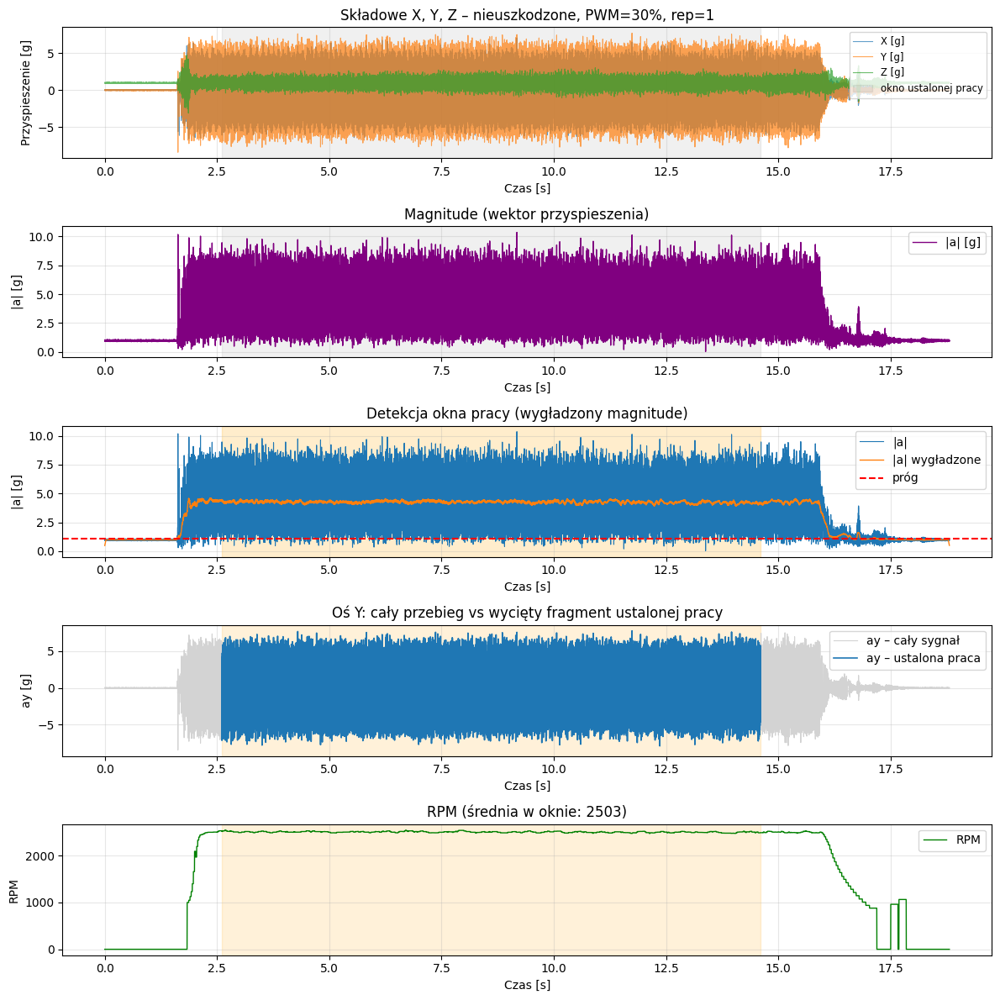


=== STATYSTYKI W OKNIE PRACY ===
Czas rozpoczęcia: 2.61 s
Czas zakończenia: 14.61 s
Długość okna: 12.00 s
Liczba próbek w oknie: 19201
Częstotliwość próbkowania: 1600 Hz
Średnie RPM w oknie: 2503 ± 13


In [2]:
# Komórka 1A - Podgląd przykładowego sygnału i wycinka ustalonej pracy

example_row = None

preferred = files_df[
    (files_df["condition"] == "nieuszkodzone") &
    (files_df["pwm"] == 30)
]

if not preferred.empty:
    example_row = preferred.iloc[0]
elif not files_df.empty:
    example_row = files_df.iloc[0]

if example_row is not None:
    path_ex = example_row["path"]
    t, ax, ay, az, rpm, Fs = load_data_from_csv(path_ex)
    t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh = \
        detect_steady_window(t, ax, ay, az)
    
    # Oblicz magnitude dla segmentu
    mag_seg = np.sqrt(ax_seg**2 + ay_seg**2 + az_seg**2)

    fig, axes = plt.subplots(5, 1, figsize=(12, 12), sharex=False)

    # X, Y, Z
    ax0 = axes[0]
    ax0.plot(t, ax, label="X [g]", lw=0.8, alpha=0.7)
    ax0.plot(t, ay, label="Y [g]", lw=0.8, alpha=0.7)
    ax0.plot(t, az, label="Z [g]", lw=0.8, alpha=0.7)
    ax0.axvspan(t_start, t_end, color="k", alpha=0.06, label="okno ustalonej pracy")
    ax0.set_xlabel("Czas [s]")
    ax0.set_ylabel("Przyspieszenie [g]")
    ax0.set_title(
        f"Składowe X, Y, Z – {example_row['condition']}, "
        f"PWM={example_row['pwm']}%, rep={example_row['rep']}"
    )
    ax0.legend(loc='upper right', fontsize='small')
    ax0.grid(alpha=0.3)

    # Magnitude (wektor przyspieszenia)
    ax1 = axes[1]
    magnitude = np.sqrt(ax**2 + ay**2 + az**2)
    ax1.plot(t, magnitude, label="|a| [g]", lw=1.0, color='purple')
    ax1.axvspan(t_start, t_end, color="k", alpha=0.06)
    ax1.set_xlabel("Czas [s]")
    ax1.set_ylabel("|a| [g]")
    ax1.set_title("Magnitude (wektor przyspieszenia)")
    ax1.legend(loc='upper right')
    ax1.grid(alpha=0.3)

    # moduł przyspieszenia + próg (oryginalna detekcja)
    ax2 = axes[2]
    ax2.plot(t, mag, label="|a|", lw=0.8)
    ax2.plot(t, mag_smooth, label="|a| wygładzone", lw=1.0)
    ax2.axhline(thresh, color="r", linestyle="--", label="próg")
    ax2.axvspan(t_start, t_end, color="orange", alpha=0.2)
    ax2.set_xlabel("Czas [s]")
    ax2.set_ylabel("|a| [g]")
    ax2.set_title("Detekcja okna pracy (wygładzony magnitude)")
    ax2.legend(loc='upper right')
    ax2.grid(alpha=0.3)

    # oś Y: cały przebieg vs wycięty fragment
    ax3 = axes[3]
    ax3.plot(t, ay, label="ay – cały sygnał", color="lightgray", lw=0.8)
    ax3.plot(t_seg, ay_seg, label="ay – ustalona praca", lw=1.2)
    ax3.axvspan(t_start, t_end, color="orange", alpha=0.15)
    ax3.set_xlabel("Czas [s]")
    ax3.set_ylabel("ay [g]")
    ax3.set_title("Oś Y: cały przebieg vs wycięty fragment ustalonej pracy")
    ax3.legend(loc='upper right')
    ax3.grid(alpha=0.3)

    # RPM
    ax4 = axes[4]
    if rpm is not None:
        ax4.plot(t, rpm, label="RPM", color="green", lw=1.0)
        ax4.axvspan(t_start, t_end, color="orange", alpha=0.15)
        ax4.set_xlabel("Czas [s]")
        ax4.set_ylabel("RPM")
        ax4.set_title(f"RPM (średnia w oknie: {np.mean(rpm[(t >= t_start) & (t <= t_end)]):.0f})")
        ax4.legend(loc='upper right')
        ax4.grid(alpha=0.3)
    else:
        ax4.text(0.5, 0.5, "Brak danych RPM", ha='center', va='center', transform=ax4.transAxes)
        ax4.set_title("RPM - brak danych")

    plt.tight_layout()
    plt.show()
    
    # Dodatkowa analiza: statystyki sygnału w oknie pracy
    print("\n=== STATYSTYKI W OKNIE PRACY ===")
    print(f"Czas rozpoczęcia: {t_start:.2f} s")
    print(f"Czas zakończenia: {t_end:.2f} s")
    print(f"Długość okna: {t_end - t_start:.2f} s")
    print(f"Liczba próbek w oknie: {len(ay_seg)}")
    print(f"Częstotliwość próbkowania: {Fs:.0f} Hz")
    if rpm is not None:
        rpm_in_window = rpm[(t >= t_start) & (t <= t_end)]
        print(f"Średnie RPM w oknie: {np.mean(rpm_in_window):.0f} ± {np.std(rpm_in_window):.0f}")
else:
    print("Brak danych w files_df – nie można pokazać przykładowego sygnału.")

=== ANALIZA WARTOSCI RPM DLA RÓŻNYCH PWM ===
Obliczanie średnich RPM w oknach pracy ustalonej...
nieuszkodzone, PWM=20%, rep=1: 1719 RPM
nieuszkodzone, PWM=20%, rep=2: 1709 RPM
nieuszkodzone, PWM=20%, rep=3: 1707 RPM
nieuszkodzone, PWM=20%, rep=4: 1702 RPM
nieuszkodzone, PWM=20%, rep=5: 1705 RPM
nieuszkodzone, PWM=30%, rep=1: 2503 RPM
nieuszkodzone, PWM=30%, rep=2: 2511 RPM
nieuszkodzone, PWM=30%, rep=3: 2495 RPM
nieuszkodzone, PWM=30%, rep=4: 2497 RPM
nieuszkodzone, PWM=30%, rep=5: 2505 RPM
nieuszkodzone, PWM=40%, rep=1: 3249 RPM
nieuszkodzone, PWM=40%, rep=2: 3226 RPM
nieuszkodzone, PWM=40%, rep=3: 3230 RPM
nieuszkodzone, PWM=40%, rep=4: 3216 RPM
nieuszkodzone, PWM=40%, rep=5: 3221 RPM
nieuszkodzone, PWM=50%, rep=1: 3911 RPM
nieuszkodzone, PWM=50%, rep=2: 3890 RPM
nieuszkodzone, PWM=50%, rep=3: 3879 RPM
nieuszkodzone, PWM=50%, rep=4: 3870 RPM
nieuszkodzone, PWM=50%, rep=5: 3866 RPM
uszkodzone, PWM=20%, rep=1: 1772 RPM
uszkodzone, PWM=20%, rep=2: 1753 RPM
uszkodzone, PWM=20%, rep=3: 1

,Condition,PWM [%],N,Mean RPM,Std RPM,Min RPM,Max RPM,CV [%]
0,nieuszkodzone,20,5,1708.344651,5.784279,1702.001406,1718.888964,0.338590
1,nieuszkodzone,30,5,2502.265048,5.705020,2495.199417,2510.999063,0.227994
2,nieuszkodzone,40,5,3228.099647,11.342870,3215.504036,3248.615749,0.351379
3,nieuszkodzone,50,5,3883.171525,16.126129,3865.852768,3910.753034,0.415282
4,uszkodzone,20,5,1744.833571,16.460016,1726.707099,1771.750950,0.943357
5,uszkodzone,30,5,2507.481602,12.144162,2493.549503,2528.154062,0.484317
6,uszkodzone,40,5,3238.440498,15.658219,3214.532108,3255.936826,0.483511
7,uszkodzone,50,5,3900.914275,15.166866,3883.625176,3919.753086,0.388803


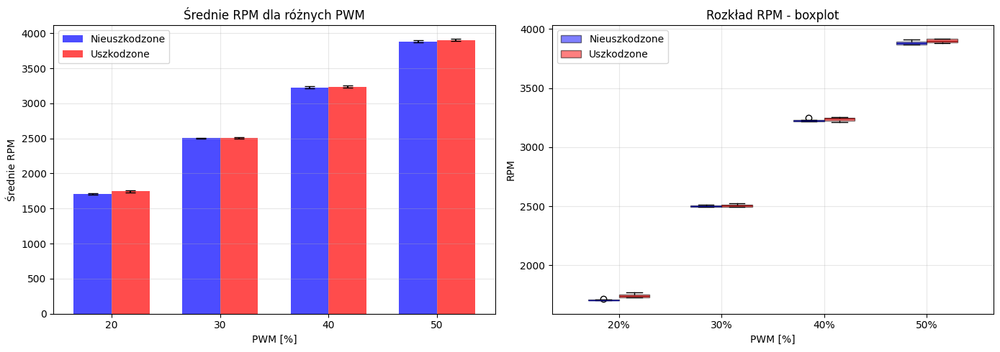


=== TESTY STATYSTYCZNE RÓŻNIC RPM ===

PWM=20%:
  Nieuszkodzone: 1708 ± 6 RPM
  Uszkodzone: 1745 ± 16 RPM
  Różnica: 36 RPM
  Test t-Studenta: t=-4.183, p=0.0087
  Normalność (Shapiro-Wilk): ok p=0.4326, dmg p=0.6318
  → ISTOTNA RÓŻNICA przy p<0.05

PWM=30%:
  Nieuszkodzone: 2502 ± 6 RPM
  Uszkodzone: 2507 ± 12 RPM
  Różnica: 5 RPM
  Test t-Studenta: t=-0.778, p=0.4679
  Normalność (Shapiro-Wilk): ok p=0.7554, dmg p=0.6671
  → BRAK ISTOTNEJ RÓŻNICY przy p<0.05

PWM=40%:
  Nieuszkodzone: 3228 ± 11 RPM
  Uszkodzone: 3238 ± 16 RPM
  Różnica: 10 RPM
  Test t-Studenta: t=-1.070, p=0.3189
  Normalność (Shapiro-Wilk): ok p=0.4839, dmg p=0.5127
  → BRAK ISTOTNEJ RÓŻNICY przy p<0.05

PWM=50%:
  Nieuszkodzone: 3883 ± 16 RPM
  Uszkodzone: 3901 ± 15 RPM
  Różnica: 18 RPM
  Test t-Studenta: t=-1.603, p=0.1478
  Normalność (Shapiro-Wilk): ok p=0.5696, dmg p=0.2608
  → BRAK ISTOTNEJ RÓŻNICY przy p<0.05

=== NOMINALNE RPM (do użycia w dalszej analizie) ===
PWM=20%: nieuszkodzone=1708 RPM, uszkodzone=

In [3]:
# Nowa komórka - Analiza wartości RPM dla różnych PWM
print("=== ANALIZA WARTOSCI RPM DLA RÓŻNYCH PWM ===")
print("Obliczanie średnich RPM w oknach pracy ustalonej...")

# Struktura do przechowywania statystyk RPM
rpm_stats = {
    'nieuszkodzone': {},
    'uszkodzone': {}
}

# Przechodzimy przez wszystkie pliki i zbieramy RPM
for cond_label, cond_dir_name in CONDITION_DIRS.items():
    for pwm_dir in PWM_DIRS:
        pwm_val = int(pwm_dir.replace("pwm_", "").replace("%", ""))
        
        if pwm_val not in rpm_stats[cond_label]:
            rpm_stats[cond_label][pwm_val] = []
        
        dir_path = BASE / cond_dir_name / pwm_dir
        csv_files = sorted(dir_path.glob("*.csv"))
        
        for csv_path in csv_files:
            stem = csv_path.stem
            # Pomijamy pliki 3200Hz
            if stem.startswith("3200Hz"):
                continue
            
            try:
                # Wczytaj dane
                t, ax, ay, az, rpm, Fs = load_data_from_csv(csv_path)
                
                # Detekcja okna pracy ustalonej
                t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh = \
                    detect_steady_window(t, ax, ay, az)
                
                # Oblicz średnie RPM w oknie
                if rpm is not None:
                    mask = (t >= t_start) & (t <= t_end)
                    if np.any(mask):
                        rpm_in_window = rpm[mask]
                        if len(rpm_in_window) > 0:
                            avg_rpm = np.mean(rpm_in_window)
                            rpm_stats[cond_label][pwm_val].append(avg_rpm)
                            # Pobierz numer replikacji
                            try:
                                rep = int(stem.split("_")[0])
                                print(f"{cond_label}, PWM={pwm_val}%, rep={rep}: {avg_rpm:.0f} RPM")
                            except:
                                pass
            except Exception as e:
                print(f"Błąd przy przetwarzaniu {csv_path}: {e}")

# Oblicz statystyki
print("\n=== STATYSTYKI RPM ===")
stats_data = []

for cond_label in ['nieuszkodzone', 'uszkodzone']:
    for pwm in sorted(rpm_stats[cond_label].keys()):
        rpm_values = rpm_stats[cond_label][pwm]
        if len(rpm_values) > 0:
            mean_rpm = np.mean(rpm_values)
            std_rpm = np.std(rpm_values)
            min_rpm = np.min(rpm_values)
            max_rpm = np.max(rpm_values)
            
            stats_data.append({
                'Condition': cond_label,
                'PWM [%]': pwm,
                'N': len(rpm_values),
                'Mean RPM': mean_rpm,
                'Std RPM': std_rpm,
                'Min RPM': min_rpm,
                'Max RPM': max_rpm,
                'CV [%]': (std_rpm / mean_rpm * 100) if mean_rpm > 0 else 0
            })
            
            print(f"{cond_label}, PWM={pwm}%: {mean_rpm:.0f} ± {std_rpm:.0f} RPM (n={len(rpm_values)})")

# Utwórz DataFrame ze statystykami
rpm_stats_df = pd.DataFrame(stats_data)
print("\nTabela statystyk RPM:")
display(rpm_stats_df)

# Wizualizacja
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Wykres słupkowy średnich RPM
ax1 = axes[0]
pwm_values = sorted(rpm_stats['nieuszkodzone'].keys())
x = np.arange(len(pwm_values))
width = 0.35

means_ok = []
means_dmg = []
std_ok = []
std_dmg = []

for pwm in pwm_values:
    if pwm in rpm_stats['nieuszkodzone'] and len(rpm_stats['nieuszkodzone'][pwm]) > 0:
        means_ok.append(np.mean(rpm_stats['nieuszkodzone'][pwm]))
        std_ok.append(np.std(rpm_stats['nieuszkodzone'][pwm]))
    else:
        means_ok.append(0)
        std_ok.append(0)
    
    if pwm in rpm_stats['uszkodzone'] and len(rpm_stats['uszkodzone'][pwm]) > 0:
        means_dmg.append(np.mean(rpm_stats['uszkodzone'][pwm]))
        std_dmg.append(np.std(rpm_stats['uszkodzone'][pwm]))
    else:
        means_dmg.append(0)
        std_dmg.append(0)

bars1 = ax1.bar(x - width/2, means_ok, width, label='Nieuszkodzone', 
                yerr=std_ok, capsize=5, color='blue', alpha=0.7)
bars2 = ax1.bar(x + width/2, means_dmg, width, label='Uszkodzone',
                yerr=std_dmg, capsize=5, color='red', alpha=0.7)

ax1.set_xlabel('PWM [%]')
ax1.set_ylabel('Średnie RPM')
ax1.set_title('Średnie RPM dla różnych PWM')
ax1.set_xticks(x)
ax1.set_xticklabels(pwm_values)
ax1.legend()
ax1.grid(True, alpha=0.3)

# Wykres pudełkowy (boxplot)
ax2 = axes[1]
box_data_ok = []
box_data_dmg = []
box_labels = []

for pwm in pwm_values:
    if pwm in rpm_stats['nieuszkodzone'] and len(rpm_stats['nieuszkodzone'][pwm]) > 0:
        box_data_ok.append(rpm_stats['nieuszkodzone'][pwm])
        box_data_dmg.append(rpm_stats['uszkodzone'][pwm])
        box_labels.append(f'{pwm}%')

positions = np.arange(len(pwm_values))
bp1 = ax2.boxplot(box_data_ok, positions=positions-0.15, widths=0.3, 
                  patch_artist=True, boxprops=dict(facecolor='blue', alpha=0.5),
                  medianprops=dict(color='darkblue'))
bp2 = ax2.boxplot(box_data_dmg, positions=positions+0.15, widths=0.3,
                  patch_artist=True, boxprops=dict(facecolor='red', alpha=0.5),
                  medianprops=dict(color='darkred'))

ax2.set_xlabel('PWM [%]')
ax2.set_ylabel('RPM')
ax2.set_title('Rozkład RPM - boxplot')
ax2.set_xticks(positions)
ax2.set_xticklabels(box_labels)
ax2.legend([bp1["boxes"][0], bp2["boxes"][0]], ['Nieuszkodzone', 'Uszkodzone'])
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Testy statystyczne różnic
print("\n=== TESTY STATYSTYCZNE RÓŻNIC RPM ===")
from scipy import stats

for pwm in pwm_values:
    if (pwm in rpm_stats['nieuszkodzone'] and len(rpm_stats['nieuszkodzone'][pwm]) > 0 and
        pwm in rpm_stats['uszkodzone'] and len(rpm_stats['uszkodzone'][pwm]) > 0):
        
        rpm_ok = rpm_stats['nieuszkodzone'][pwm]
        rpm_dmg = rpm_stats['uszkodzone'][pwm]
        
        # Test t-Studenta (zakładamy normalność)
        t_stat, p_value = stats.ttest_ind(rpm_ok, rpm_dmg, equal_var=False)
        
        # Test normalności
        _, p_norm_ok = stats.shapiro(rpm_ok)
        _, p_norm_dmg = stats.shapiro(rpm_dmg)
        
        print(f"\nPWM={pwm}%:")
        print(f"  Nieuszkodzone: {np.mean(rpm_ok):.0f} ± {np.std(rpm_ok):.0f} RPM")
        print(f"  Uszkodzone: {np.mean(rpm_dmg):.0f} ± {np.std(rpm_dmg):.0f} RPM")
        print(f"  Różnica: {np.mean(rpm_dmg) - np.mean(rpm_ok):.0f} RPM")
        print(f"  Test t-Studenta: t={t_stat:.3f}, p={p_value:.4f}")
        print(f"  Normalność (Shapiro-Wilk): ok p={p_norm_ok:.4f}, dmg p={p_norm_dmg:.4f}")
        
        if p_value < 0.05:
            print(f"  → ISTOTNA RÓŻNICA przy p<0.05")
        else:
            print(f"  → BRAK ISTOTNEJ RÓŻNICY przy p<0.05")

# Zapisz nominalne RPM do użycia w dalszej analizie
NOMINAL_RPM = {}
for pwm in pwm_values:
    if (pwm in rpm_stats['nieuszkodzone'] and len(rpm_stats['nieuszkodzone'][pwm]) > 0):
        NOMINAL_RPM[pwm] = {
            'nieuszkodzone': np.mean(rpm_stats['nieuszkodzone'][pwm]),
            'uszkodzone': np.mean(rpm_stats['uszkodzone'][pwm]) if pwm in rpm_stats['uszkodzone'] else None
        }

print("\n=== NOMINALNE RPM (do użycia w dalszej analizie) ===")
for pwm, values in NOMINAL_RPM.items():
    uszkodzone_str = f"{values['uszkodzone']:.0f}" if values['uszkodzone'] else 'N/A'
    print(f"PWM={pwm}%: nieuszkodzone={values['nieuszkodzone']:.0f} RPM, "
          f"uszkodzone={uszkodzone_str} RPM")


ANALIZA DLA PWM = 20%

Liczba segmentów: nieuszkodzone=5, uszkodzone=5

--- Analiza Oś X ---


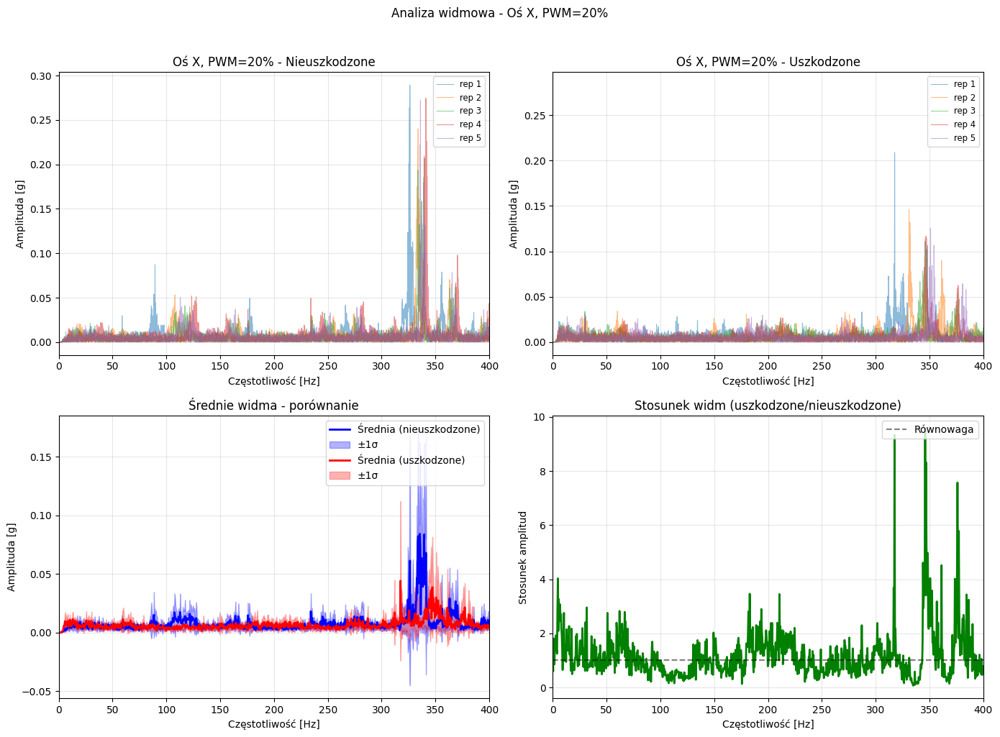


=== RÓŻNICE W ENERGII WIDMA (ax) ===
Pasmo low: +0.0440 g·Hz
Pasmo mid: -0.1605 g·Hz
Pasmo high: -0.3769 g·Hz

--- Analiza Oś Y ---


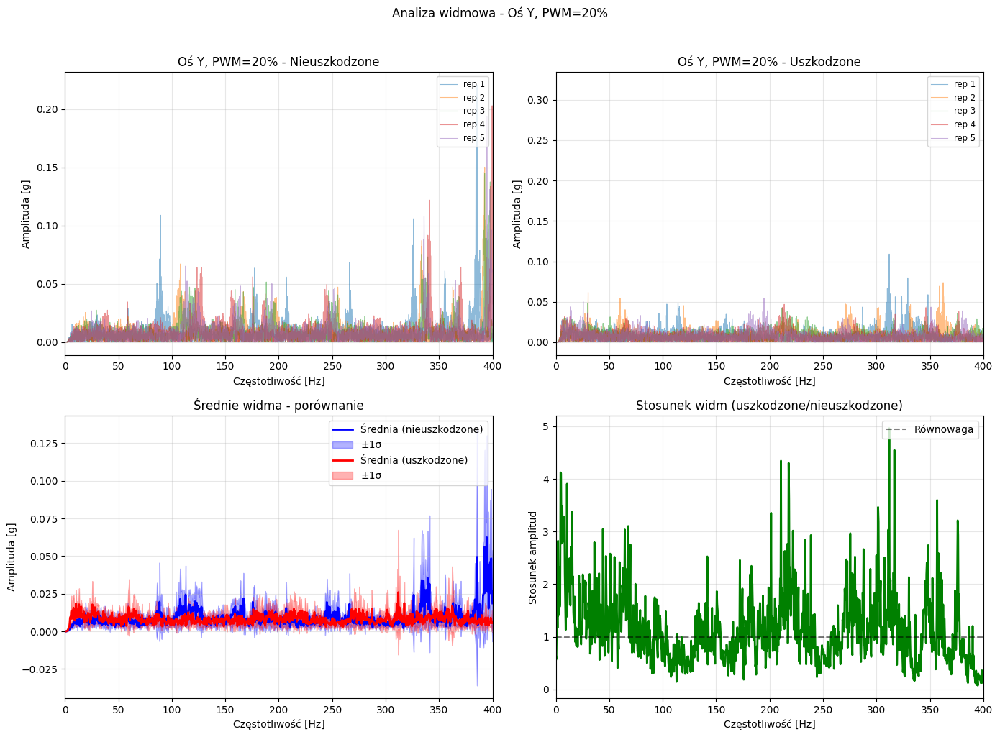


=== RÓŻNICE W ENERGII WIDMA (ay) ===
Pasmo low: +0.1504 g·Hz
Pasmo mid: -0.1795 g·Hz
Pasmo high: -0.3793 g·Hz

--- Analiza Oś Z ---


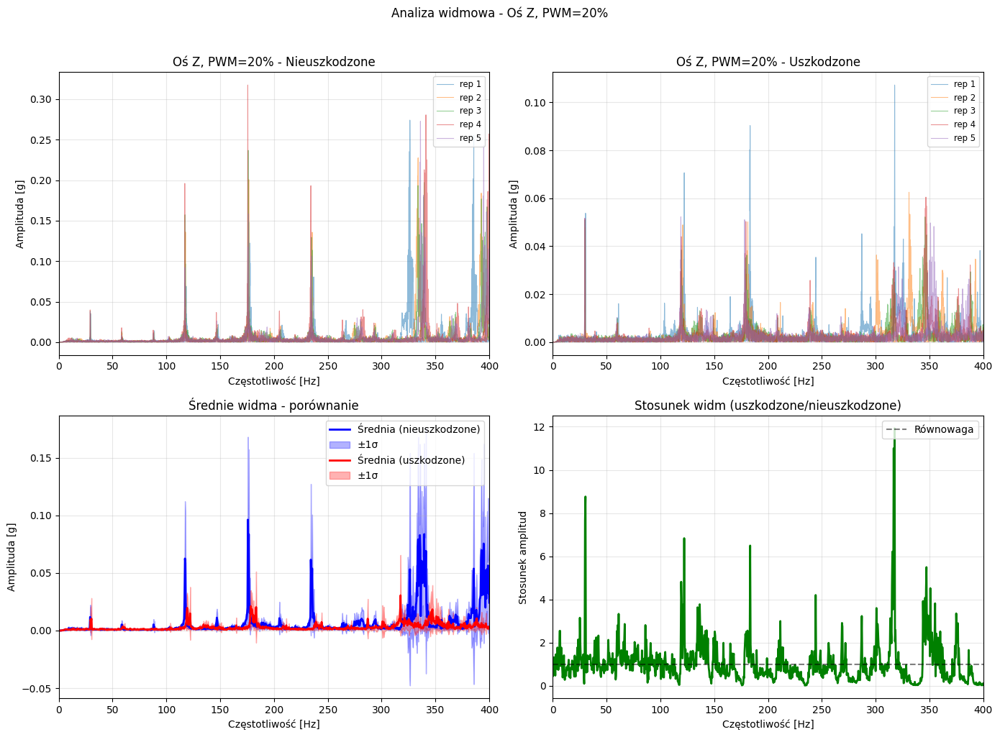


=== RÓŻNICE W ENERGII WIDMA (az) ===
Pasmo low: -0.0007 g·Hz
Pasmo mid: -0.1606 g·Hz
Pasmo high: -1.1924 g·Hz

--- Analiza Magnitude ---


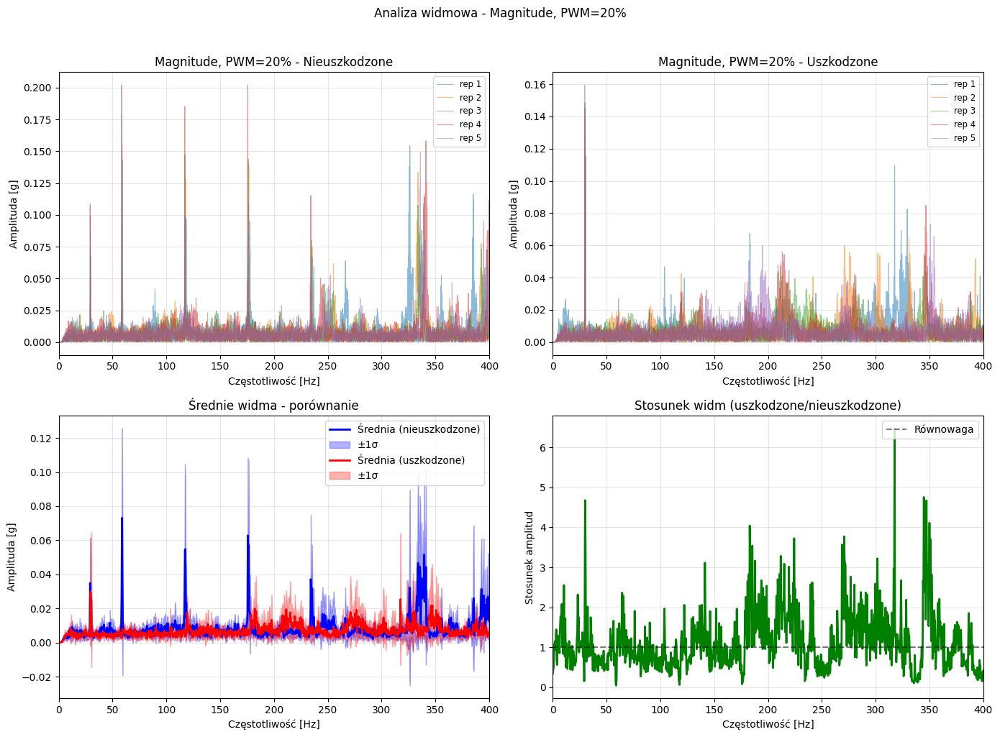


=== RÓŻNICE W ENERGII WIDMA (mag) ===
Pasmo low: -0.0338 g·Hz
Pasmo mid: -0.2363 g·Hz
Pasmo high: -0.1837 g·Hz

ANALIZA DLA PWM = 30%

Liczba segmentów: nieuszkodzone=5, uszkodzone=5

--- Analiza Oś X ---


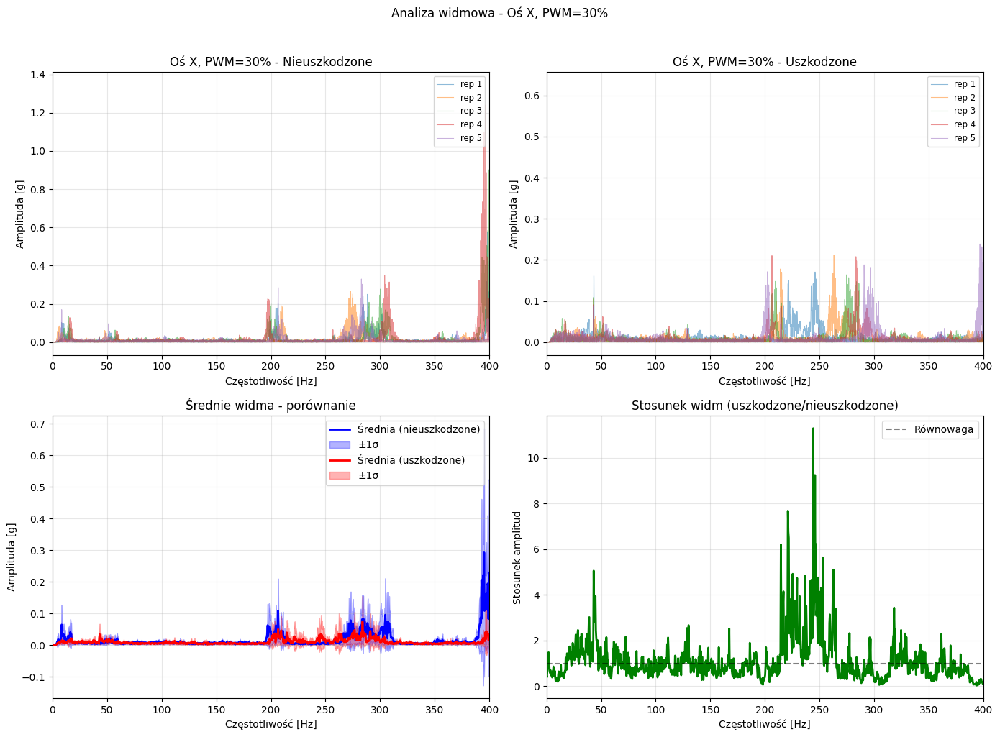


=== RÓŻNICE W ENERGII WIDMA (ax) ===
Pasmo low: -0.0549 g·Hz
Pasmo mid: -0.3101 g·Hz
Pasmo high: -1.9496 g·Hz

--- Analiza Oś Y ---


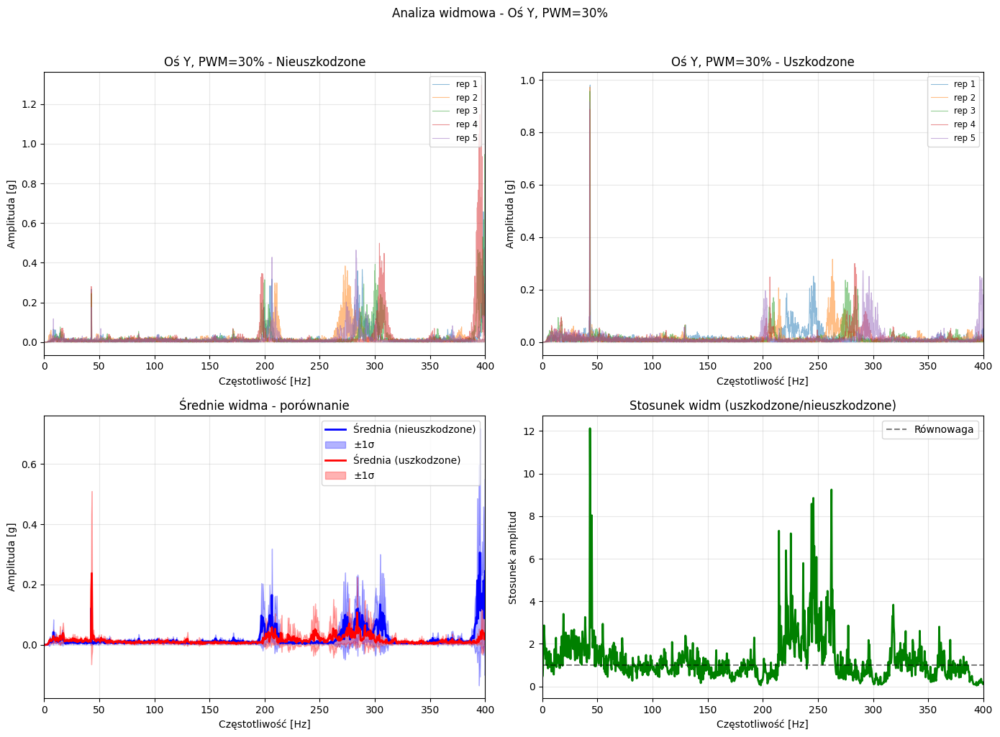


=== RÓŻNICE W ENERGII WIDMA (ay) ===
Pasmo low: +0.3850 g·Hz
Pasmo mid: -0.3797 g·Hz
Pasmo high: -2.2377 g·Hz

--- Analiza Oś Z ---


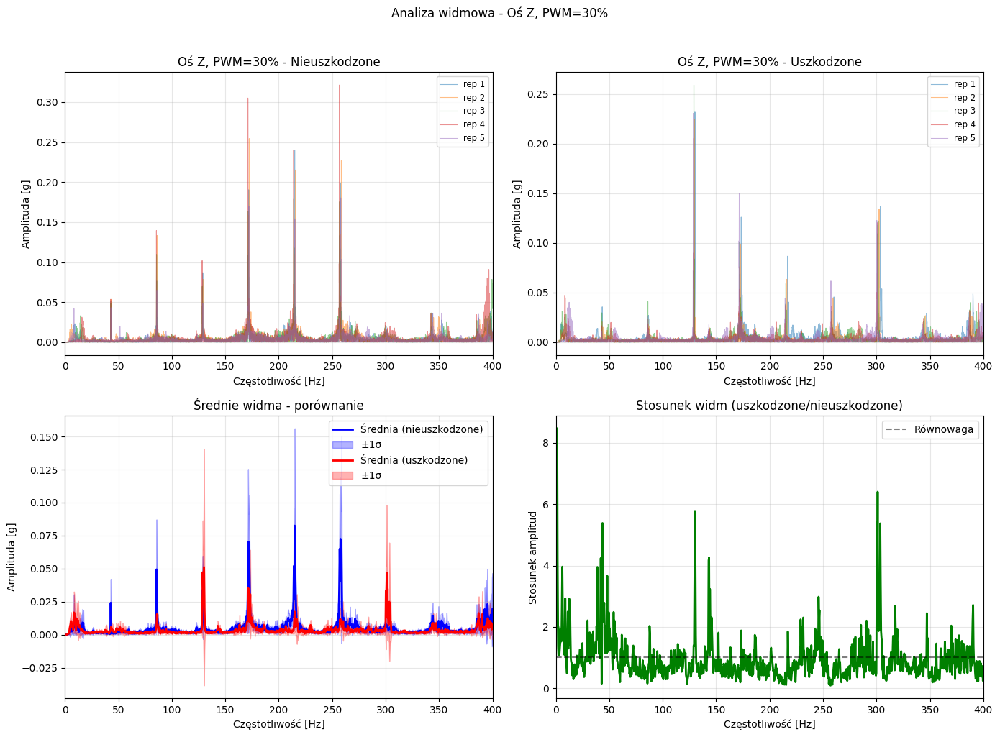


=== RÓŻNICE W ENERGII WIDMA (az) ===
Pasmo low: +0.0290 g·Hz
Pasmo mid: -0.1964 g·Hz
Pasmo high: -0.4530 g·Hz

--- Analiza Magnitude ---


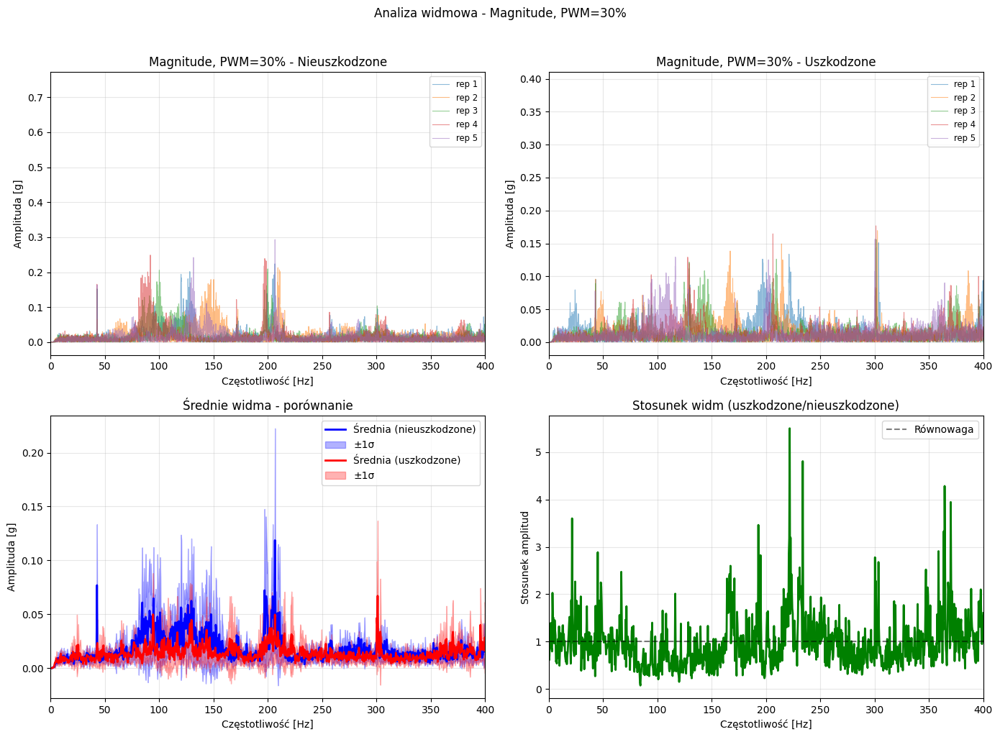


=== RÓŻNICE W ENERGII WIDMA (mag) ===
Pasmo low: -0.0050 g·Hz
Pasmo mid: -1.2415 g·Hz
Pasmo high: -0.2001 g·Hz

ANALIZA DLA PWM = 40%

Liczba segmentów: nieuszkodzone=5, uszkodzone=5

--- Analiza Oś X ---


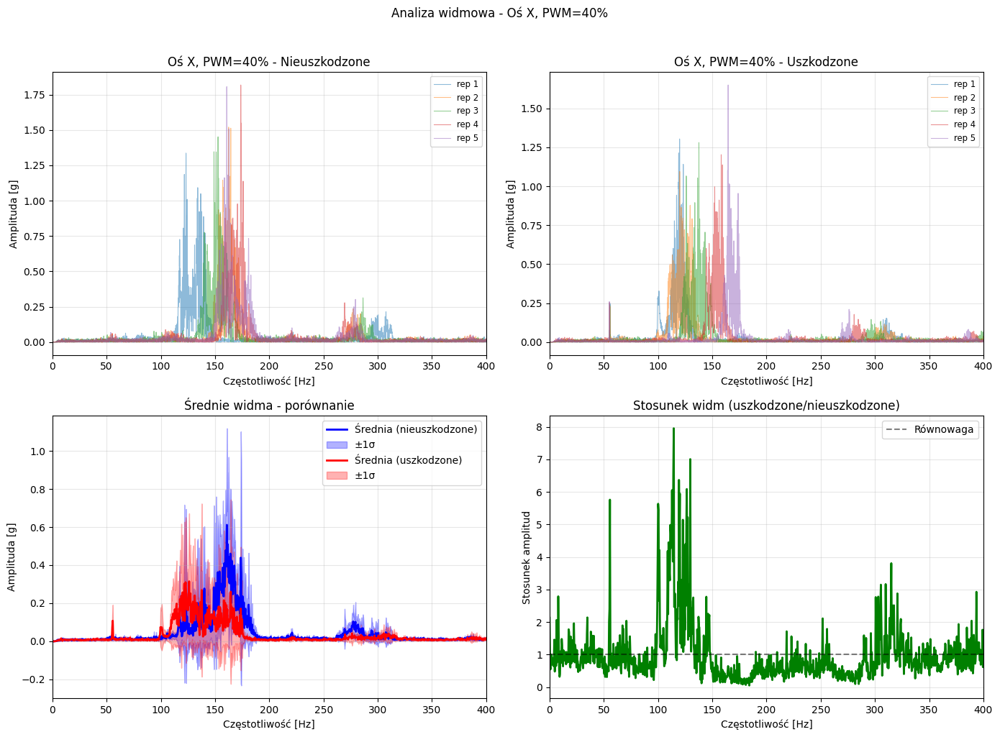


=== RÓŻNICE W ENERGII WIDMA (ax) ===
Pasmo low: -0.0216 g·Hz
Pasmo mid: -3.7255 g·Hz
Pasmo high: -1.4372 g·Hz

--- Analiza Oś Y ---


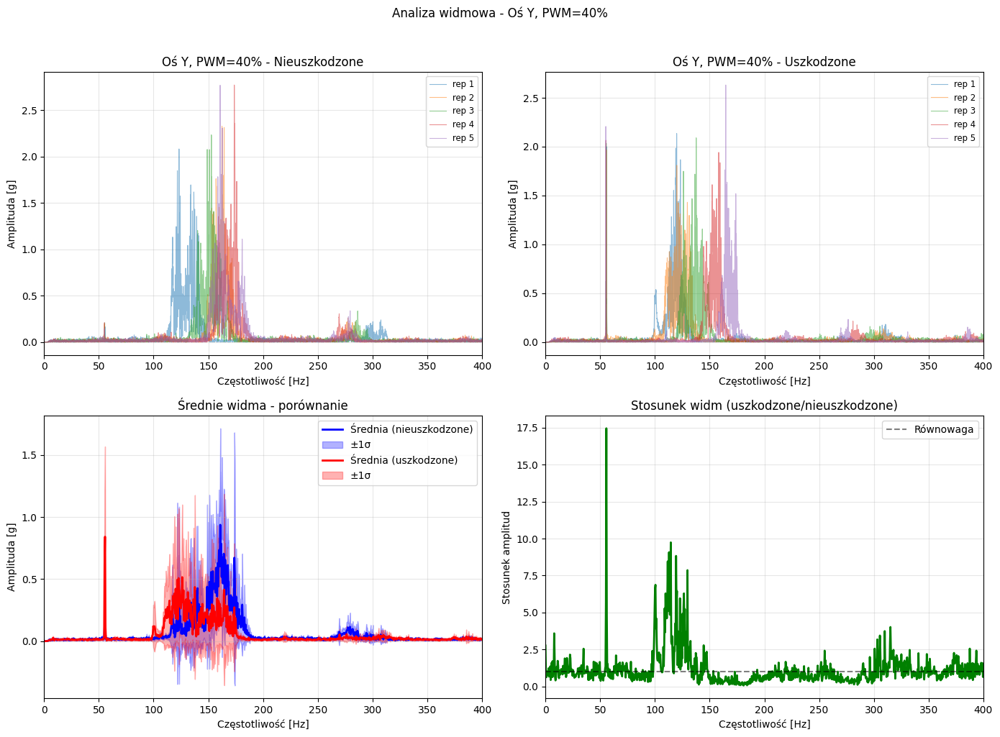


=== RÓŻNICE W ENERGII WIDMA (ay) ===
Pasmo low: -0.0043 g·Hz
Pasmo mid: -4.0835 g·Hz
Pasmo high: -1.1486 g·Hz

--- Analiza Oś Z ---


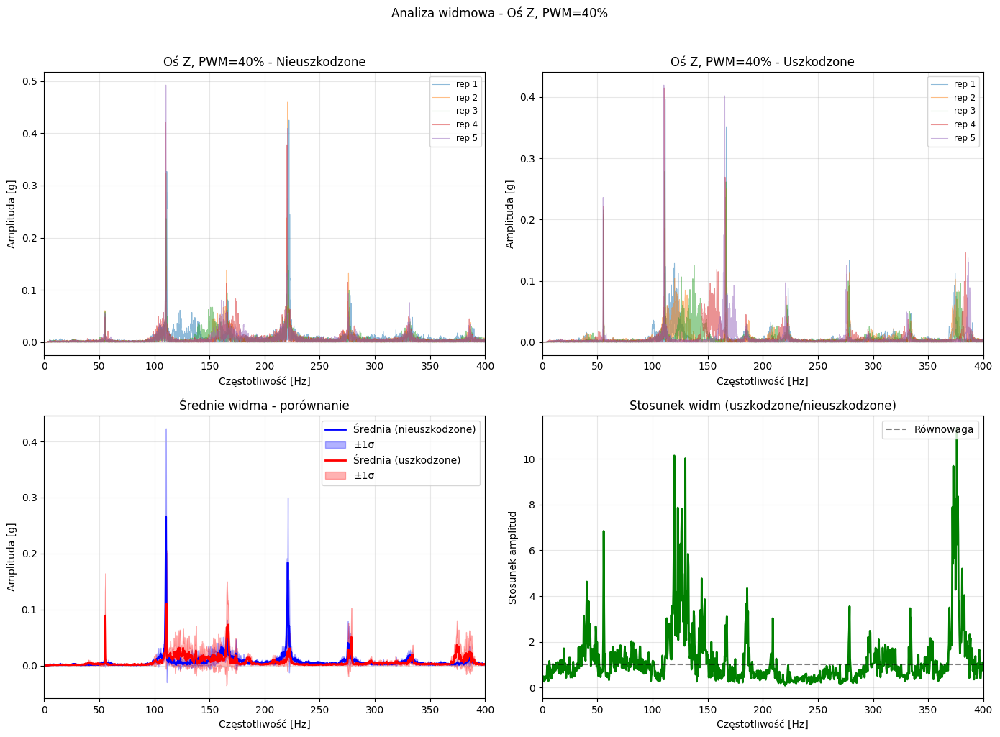


=== RÓŻNICE W ENERGII WIDMA (az) ===
Pasmo low: +0.0110 g·Hz
Pasmo mid: +0.1428 g·Hz
Pasmo high: -0.3865 g·Hz

--- Analiza Magnitude ---


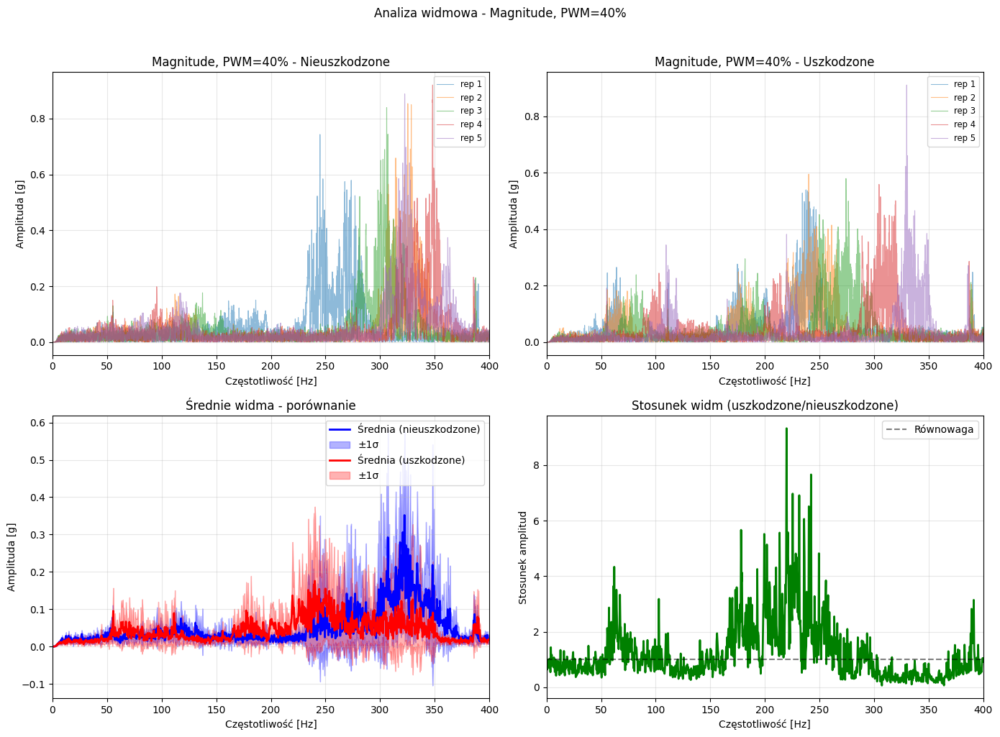


=== RÓŻNICE W ENERGII WIDMA (mag) ===
Pasmo low: -0.2438 g·Hz
Pasmo mid: +0.5032 g·Hz
Pasmo high: -3.3058 g·Hz

ANALIZA DLA PWM = 50%

Liczba segmentów: nieuszkodzone=5, uszkodzone=5

--- Analiza Oś X ---


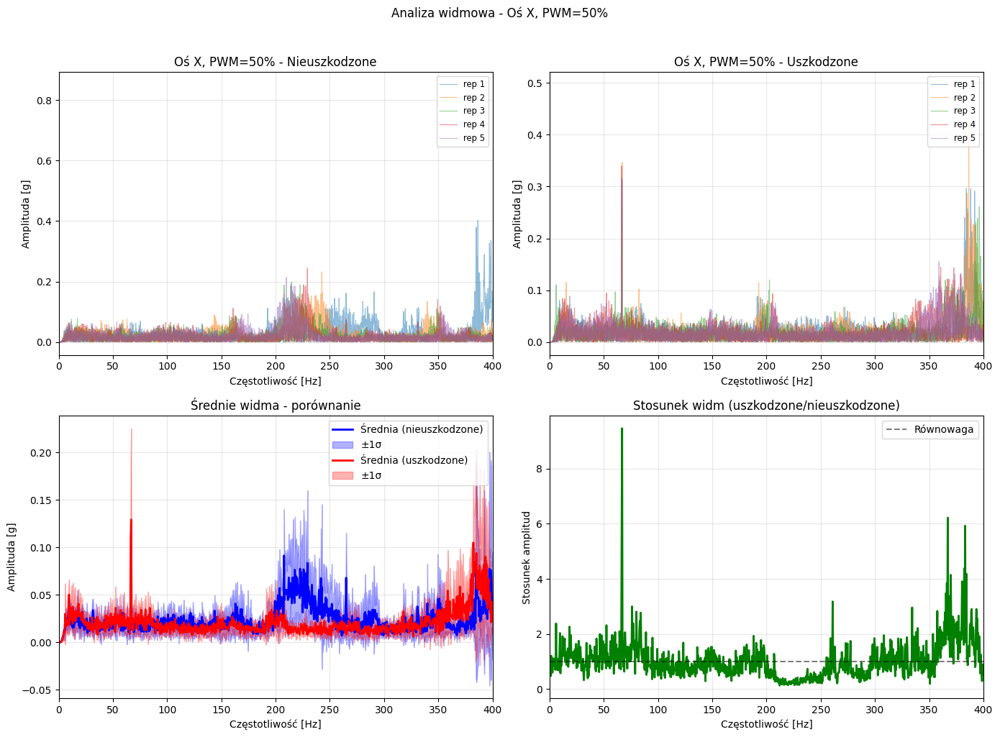


=== RÓŻNICE W ENERGII WIDMA (ax) ===
Pasmo low: +0.0882 g·Hz
Pasmo mid: -0.1095 g·Hz
Pasmo high: -1.2132 g·Hz

--- Analiza Oś Y ---


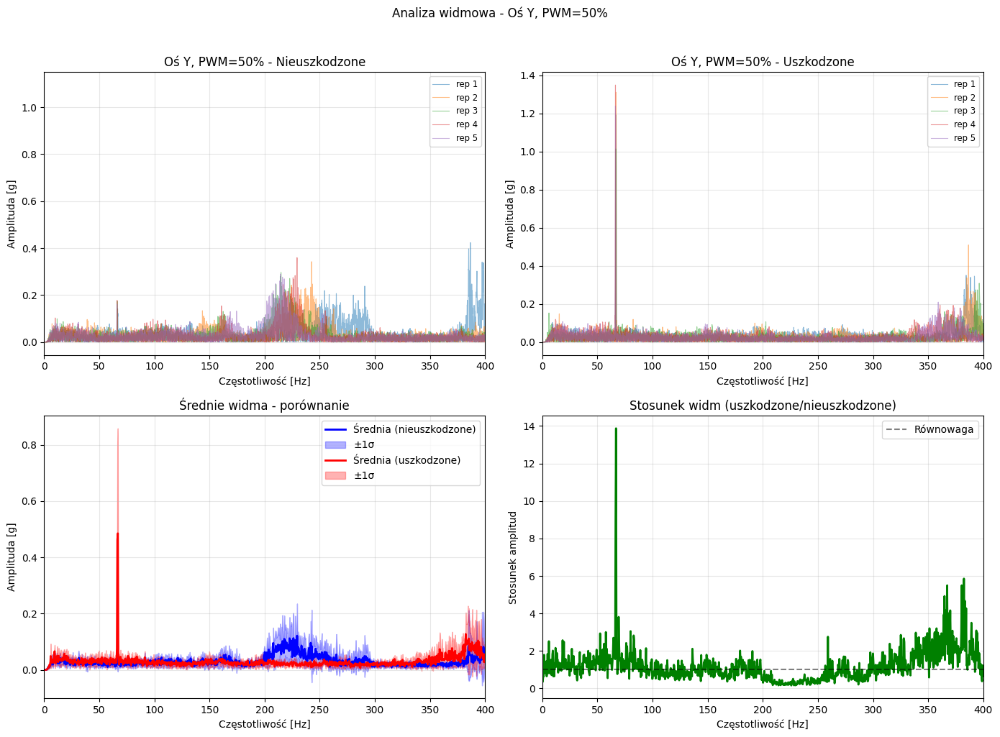


=== RÓŻNICE W ENERGII WIDMA (ay) ===
Pasmo low: +0.2767 g·Hz
Pasmo mid: +0.4280 g·Hz
Pasmo high: -1.0714 g·Hz

--- Analiza Oś Z ---


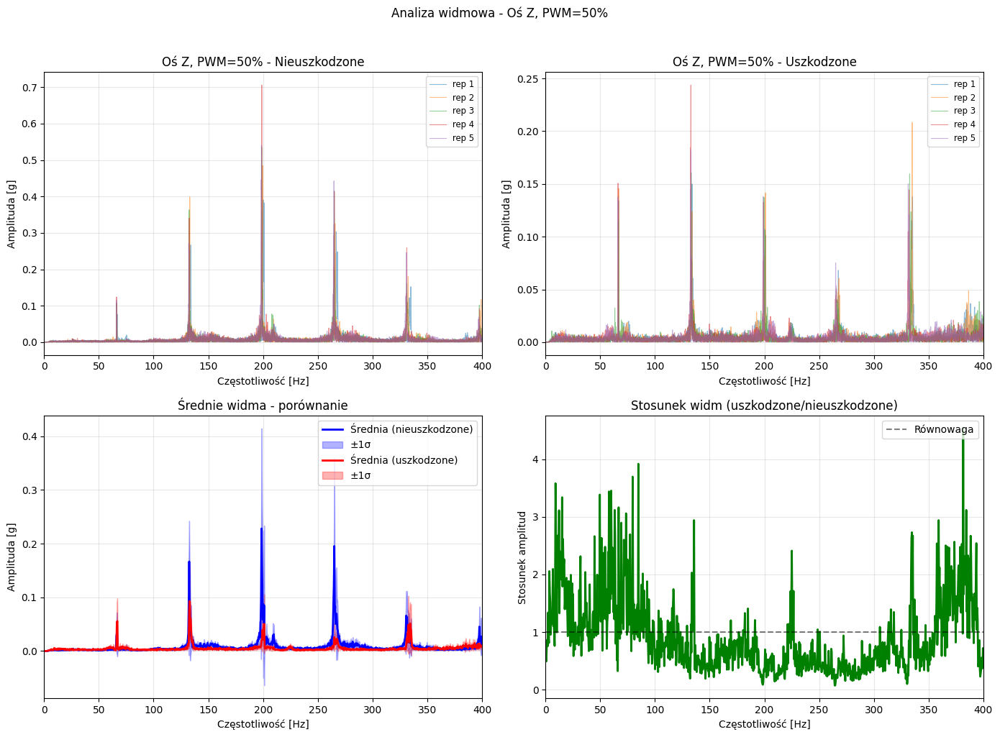


=== RÓŻNICE W ENERGII WIDMA (az) ===
Pasmo low: +0.0313 g·Hz
Pasmo mid: -0.5205 g·Hz
Pasmo high: -0.9582 g·Hz

--- Analiza Magnitude ---


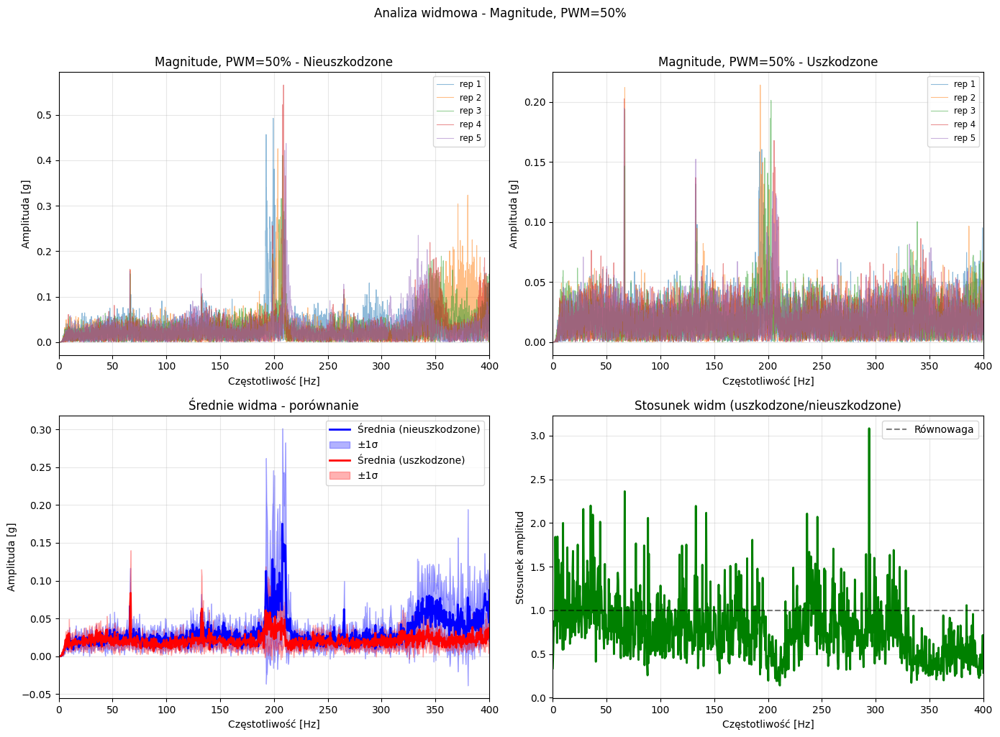


=== RÓŻNICE W ENERGII WIDMA (mag) ===
Pasmo low: +0.0471 g·Hz
Pasmo mid: -1.0277 g·Hz
Pasmo high: -3.4074 g·Hz


In [27]:
# Komórka 2 - Porównanie widm sygnałów (wszystkie osi + magnitude)
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams["figure.figsize"] = (10, 6)

pwm_values = [20, 30, 40, 50]
n_fft_pad_factor = 8
hp_cut_hz = 5.0
fmax_plot = 400.0


def compute_segments_for_selection(selection_df):
    segments = []
    for _, row in selection_df.iterrows():
        path = row["path"]
        t, ax, ay, az, rpm, Fs = load_data_from_csv(path)
        t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh = \
            detect_steady_window(t, ax, ay, az)
        
        # Oblicz magnitude dla segmentu
        mag_seg = np.sqrt(ax_seg**2 + ay_seg**2 + az_seg**2)
        
        # Średnie RPM w oknie (jeśli dostępne)
        avg_rpm = None
        if rpm is not None:
            rpm_in_window = rpm[(t >= t_start) & (t <= t_end)]
            avg_rpm = np.mean(rpm_in_window) if len(rpm_in_window) > 0 else None

        segments.append({
            "Fs": Fs,
            "t": t_seg,
            "ax": ax_seg,
            "ay": ay_seg,
            "az": az_seg,
            "mag": mag_seg,  # Dodano magnitude
            "rpm": avg_rpm,  # Dodano średnie RPM
            "meta": row,
            "t_start": t_start,
            "t_end": t_end,
        })
    return segments


def compute_fft_features(x, Fs, rpm=None, hp_cut=5.0, pad_factor=8):
    """
    Oblicza FFT z dodatkowymi cechami widmowymi.
    
    Zwraca:
      freqs, amp, features_dict
    """
    N0 = int(min(len(x), 2 * Fs))
    x0 = x - np.mean(x[:N0])
    b, a = signal.butter(2, hp_cut / (Fs / 2), btype="highpass")
    x_hp = signal.filtfilt(b, a, x0)

    w = signal.windows.hann(len(x_hp), sym=False)
    CG = np.sum(w) / len(w)
    xw = x_hp * w
    N = len(xw)
    N_fft = int(2 ** np.ceil(np.log2(N))) * pad_factor
    X = np.fft.rfft(xw, n=N_fft)
    freqs = np.fft.rfftfreq(N_fft, 1.0 / Fs)
    amp = (2.0 / (N * CG)) * np.abs(X)
    amp[0] /= 2.0
    
    # Oblicz dodatkowe cechy widmowe
    features = {}
    
    # Pasma częstotliwościowe charakterystyczne dla śmigieł
    bands = {
        'low': (0, 50),
        'mid': (50, 200),
        'high': (200, 400),
    }
    
    for band_name, (f_low, f_high) in bands.items():
        mask = (freqs >= f_low) & (freqs <= f_high)
        if np.any(mask):
            band_power = np.trapz(amp[mask]**2, freqs[mask])
            features[f'{band_name}_power'] = band_power
            features[f'{band_name}_peak_freq'] = freqs[mask][np.argmax(amp[mask])]
            features[f'{band_name}_peak_amp'] = np.max(amp[mask])
    
    # Oblicz częstotliwość podstawową i harmoniczne jeśli mamy RPM
    if rpm is not None and rpm > 0:
        f_rotational = rpm / 60.0  # Hz
        # Poszukaj harmonicznych w okolicy teoretycznych częstotliwości
        for n in range(1, 6):  # 5 pierwszych harmonicznych
            f_target = f_rotational * n
            idx = np.argmin(np.abs(freqs - f_target))
            if idx < len(amp):
                features[f'harmonic_{n}_freq'] = freqs[idx]
                features[f'harmonic_{n}_amp'] = amp[idx]
    
    return freqs, amp, features


def plot_comparative_fft(segments_ok, segments_dmg, axis_key, title_prefix, fmax=400.0):
    """
    Porównuje widma dla zdrowych i uszkodzonych śmigieł.
    """
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # 1. Widma pojedyncze (nieuszkodzone)
    ax0 = axes[0, 0]
    for seg in segments_ok:
        Fs = seg["Fs"]
        y = seg[axis_key]
        rpm = seg.get("rpm", None)
        freqs, amp, _ = compute_fft_features(y, Fs, rpm, hp_cut=hp_cut_hz, pad_factor=n_fft_pad_factor)
        rep = seg["meta"]["rep"]
        ax0.plot(freqs, amp, alpha=0.5, label=f"rep {rep}", lw=0.8)
    
    ax0.set_xlim(0, fmax)
    ax0.set_xlabel("Częstotliwość [Hz]")
    ax0.set_ylabel("Amplituda [g]")
    ax0.set_title(f"{title_prefix} - Nieuszkodzone")
    ax0.grid(alpha=0.3)
    ax0.legend(fontsize='small', loc='upper right')
    
    # 2. Widma pojedyncze (uszkodzone)
    ax1 = axes[0, 1]
    for seg in segments_dmg:
        Fs = seg["Fs"]
        y = seg[axis_key]
        rpm = seg.get("rpm", None)
        freqs, amp, _ = compute_fft_features(y, Fs, rpm, hp_cut=hp_cut_hz, pad_factor=n_fft_pad_factor)
        rep = seg["meta"]["rep"]
        ax1.plot(freqs, amp, alpha=0.5, label=f"rep {rep}", lw=0.8)
    
    ax1.set_xlim(0, fmax)
    ax1.set_xlabel("Częstotliwość [Hz]")
    ax1.set_ylabel("Amplituda [g]")
    ax1.set_title(f"{title_prefix} - Uszkodzone")
    ax1.grid(alpha=0.3)
    ax1.legend(fontsize='small', loc='upper right')
    
    # 3. Średnie widma
    ax2 = axes[1, 0]
    all_freqs_ok = []
    all_amps_ok = []
    for seg in segments_ok:
        Fs = seg["Fs"]
        y = seg[axis_key]
        rpm = seg.get("rpm", None)
        freqs, amp, _ = compute_fft_features(y, Fs, rpm, hp_cut=hp_cut_hz, pad_factor=n_fft_pad_factor)
        all_freqs_ok.append(freqs)
        all_amps_ok.append(amp)
    
    # Interpoluj do wspólnej siatki częstotliwości
    f_common = np.linspace(0, fmax, 1000)
    amps_interp_ok = []
    for freqs, amp in zip(all_freqs_ok, all_amps_ok):
        amp_interp = np.interp(f_common, freqs[freqs <= fmax], amp[freqs <= fmax])
        amps_interp_ok.append(amp_interp)
    
    mean_amp_ok = np.mean(amps_interp_ok, axis=0)
    std_amp_ok = np.std(amps_interp_ok, axis=0)
    
    ax2.plot(f_common, mean_amp_ok, 'b-', label='Średnia (nieuszkodzone)', lw=2)
    ax2.fill_between(f_common, mean_amp_ok - std_amp_ok, mean_amp_ok + std_amp_ok, 
                     alpha=0.3, color='blue', label='±1σ')
    
    # To samo dla uszkodzonych
    all_freqs_dmg = []
    all_amps_dmg = []
    for seg in segments_dmg:
        Fs = seg["Fs"]
        y = seg[axis_key]
        rpm = seg.get("rpm", None)
        freqs, amp, _ = compute_fft_features(y, Fs, rpm, hp_cut=hp_cut_hz, pad_factor=n_fft_pad_factor)
        all_freqs_dmg.append(freqs)
        all_amps_dmg.append(amp)
    
    amps_interp_dmg = []
    for freqs, amp in zip(all_freqs_dmg, all_amps_dmg):
        amp_interp = np.interp(f_common, freqs[freqs <= fmax], amp[freqs <= fmax])
        amps_interp_dmg.append(amp_interp)
    
    mean_amp_dmg = np.mean(amps_interp_dmg, axis=0)
    std_amp_dmg = np.std(amps_interp_dmg, axis=0)
    
    ax2.plot(f_common, mean_amp_dmg, 'r-', label='Średnia (uszkodzone)', lw=2)
    ax2.fill_between(f_common, mean_amp_dmg - std_amp_dmg, mean_amp_dmg + std_amp_dmg,
                     alpha=0.3, color='red', label='±1σ')
    
    ax2.set_xlim(0, fmax)
    ax2.set_xlabel("Częstotliwość [Hz]")
    ax2.set_ylabel("Amplituda [g]")
    ax2.set_title(f"Średnie widma - porównanie")
    ax2.grid(alpha=0.3)
    ax2.legend(loc='upper right')
    
    # 4. Stosunek widm (uszkodzone/nieuszkodzone)
    ax3 = axes[1, 1]
    ratio = mean_amp_dmg / (mean_amp_ok + 1e-10)  # unikaj dzielenia przez 0
    ax3.plot(f_common, ratio, 'g-', lw=2)
    ax3.axhline(y=1.0, color='k', linestyle='--', alpha=0.5, label='Równowaga')
    ax3.set_xlim(0, fmax)
    ax3.set_xlabel("Częstotliwość [Hz]")
    ax3.set_ylabel("Stosunek amplitud")
    ax3.set_title(f"Stosunek widm (uszkodzone/nieuszkodzone)")
    ax3.grid(alpha=0.3)
    ax3.legend(loc='upper right')
    
    plt.suptitle(f"Analiza widmowa - {title_prefix}", y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Analiza różnic
    diff_areas = {}
    for band_name, (f_low, f_high) in {'low': (0, 50), 'mid': (50, 200), 'high': (200, 400)}.items():
        mask = (f_common >= f_low) & (f_common <= f_high)
        if np.any(mask):
            area_ok = np.trapz(mean_amp_ok[mask], f_common[mask])
            area_dmg = np.trapz(mean_amp_dmg[mask], f_common[mask])
            diff_areas[band_name] = area_dmg - area_ok
    
    print(f"\n=== RÓŻNICE W ENERGII WIDMA ({axis_key}) ===")
    for band, diff in diff_areas.items():
        print(f"Pasmo {band}: {'+' if diff > 0 else ''}{diff:.4f} g·Hz")
    
    return diff_areas


# Analizujemy wszystkie osi + magnitude
for pwm in pwm_values:
    print(f"\n{'='*60}")
    print(f"ANALIZA DLA PWM = {pwm}%")
    print(f"{'='*60}")
    
    # Nieuszkodzone
    sel_ok = files_df[
        (files_df["condition"] == "nieuszkodzone") &
        (files_df["pwm"] == pwm)
    ].sort_values("rep")

    # Uszkodzone
    sel_dmg = files_df[
        (files_df["condition"] == "uszkodzone") &
        (files_df["pwm"] == pwm)
    ].sort_values("rep")

    if sel_ok.empty or sel_dmg.empty:
        print(f"Brak kompletu danych dla PWM={pwm}%")
        continue
    
    segments_ok = compute_segments_for_selection(sel_ok)
    segments_dmg = compute_segments_for_selection(sel_dmg)
    
    print(f"\nLiczba segmentów: nieuszkodzone={len(segments_ok)}, uszkodzone={len(segments_dmg)}")
    
    # Analiza dla każdej osi i magnitude
    for axis_key, axis_name in [('ax', 'Oś X'), ('ay', 'Oś Y'), ('az', 'Oś Z'), ('mag', 'Magnitude')]:
        print(f"\n--- Analiza {axis_name} ---")
        try:
            diff_areas = plot_comparative_fft(
                segments_ok, segments_dmg,
                axis_key=axis_key,
                title_prefix=f"{axis_name}, PWM={pwm}%",
                fmax=fmax_plot
            )
        except Exception as e:
            print(f"Błąd podczas analizy {axis_name}: {e}")


ANALIZA STFT DLA PWM = 20%

--- Oś X ---


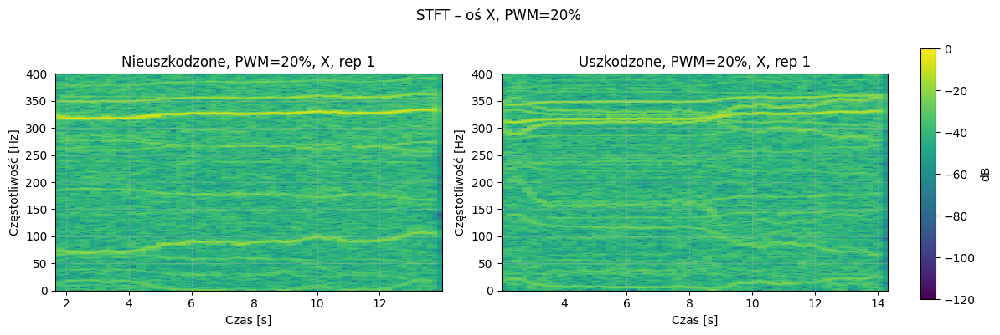


=== ANALIZA RÓŻNIC DLA X ===
Pasmo 0-50Hz: różnica = +1.7 dB (1.48x)
Pasmo 50-150Hz: różnica = +0.0 dB (1.00x)
Pasmo 150-300Hz: różnica = -0.3 dB (0.94x)
Pasmo 300-400Hz: różnica = -0.3 dB (0.94x)
Największa różnica: -16.8 dB przy 711.6 Hz

--- Oś Y ---


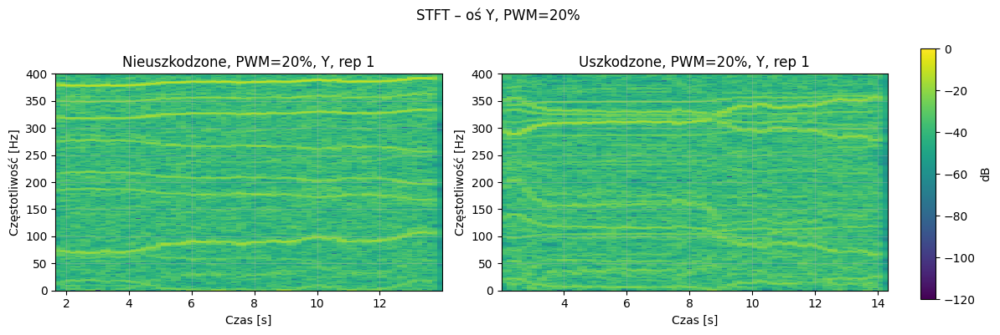


=== ANALIZA RÓŻNIC DLA Y ===
Pasmo 0-50Hz: różnica = +2.4 dB (1.76x)
Pasmo 50-150Hz: różnica = +1.5 dB (1.43x)
Pasmo 150-300Hz: różnica = -0.0 dB (1.00x)
Pasmo 300-400Hz: różnica = -1.1 dB (0.77x)
Największa różnica: -18.0 dB przy 385.9 Hz

--- Oś Z ---


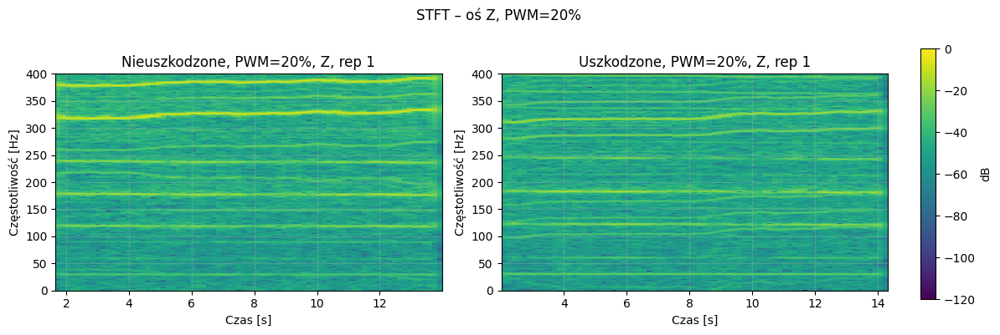


=== ANALIZA RÓŻNIC DLA Z ===
Pasmo 0-50Hz: różnica = -0.2 dB (0.96x)
Pasmo 50-150Hz: różnica = +1.1 dB (1.30x)
Pasmo 150-300Hz: różnica = -1.5 dB (0.71x)
Pasmo 300-400Hz: różnica = -4.1 dB (0.39x)
Największa różnica: -25.5 dB przy 385.9 Hz

--- Oś Magnitude ---


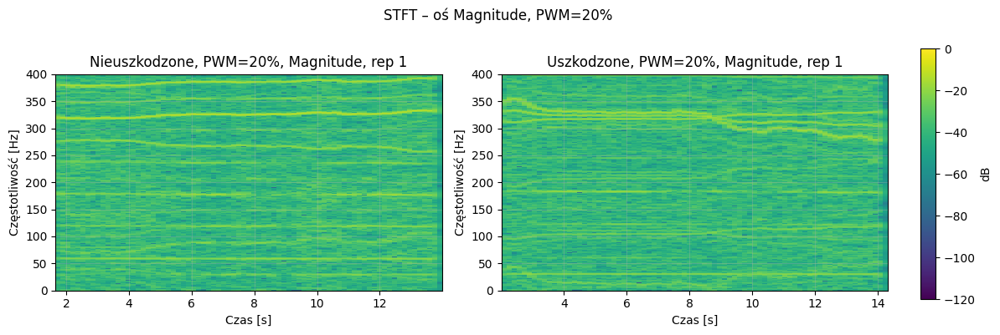


=== ANALIZA RÓŻNIC DLA Magnitude ===
Pasmo 0-50Hz: różnica = +2.0 dB (1.58x)
Pasmo 50-150Hz: różnica = -1.9 dB (0.65x)
Pasmo 150-300Hz: różnica = -0.8 dB (0.83x)
Pasmo 300-400Hz: różnica = +1.4 dB (1.39x)
Największa różnica: -14.5 dB przy 176.9 Hz

ANALIZA STFT DLA PWM = 30%

--- Oś X ---


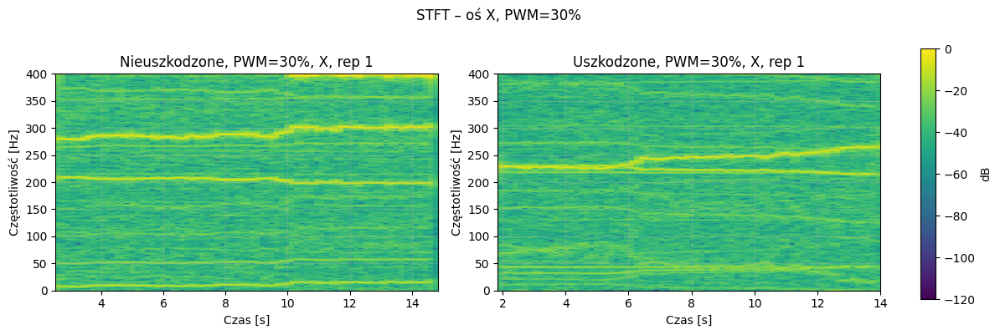


=== ANALIZA RÓŻNIC DLA X ===
Pasmo 0-50Hz: różnica = +1.4 dB (1.39x)
Pasmo 50-150Hz: różnica = -0.2 dB (0.96x)
Pasmo 150-300Hz: różnica = -0.8 dB (0.83x)
Pasmo 300-400Hz: różnica = -4.5 dB (0.36x)
Największa różnica: -26.6 dB przy 410.1 Hz

--- Oś Y ---


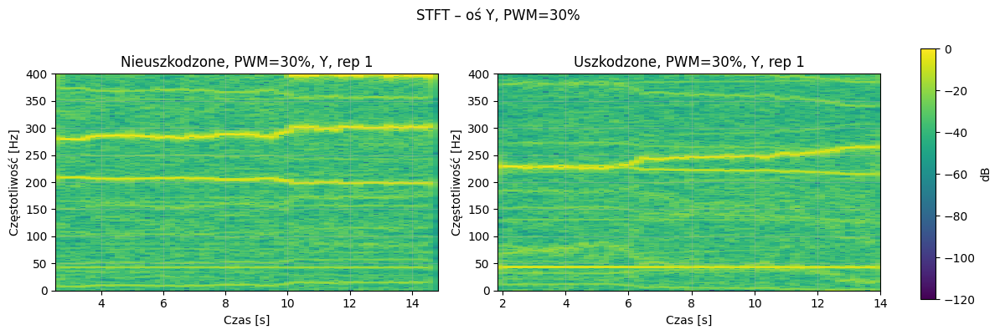


=== ANALIZA RÓŻNIC DLA Y ===
Pasmo 0-50Hz: różnica = +3.2 dB (2.08x)
Pasmo 50-150Hz: różnica = +1.1 dB (1.28x)
Pasmo 150-300Hz: różnica = -0.6 dB (0.88x)
Pasmo 300-400Hz: różnica = -4.2 dB (0.38x)
Największa różnica: -25.9 dB przy 410.1 Hz

--- Oś Z ---


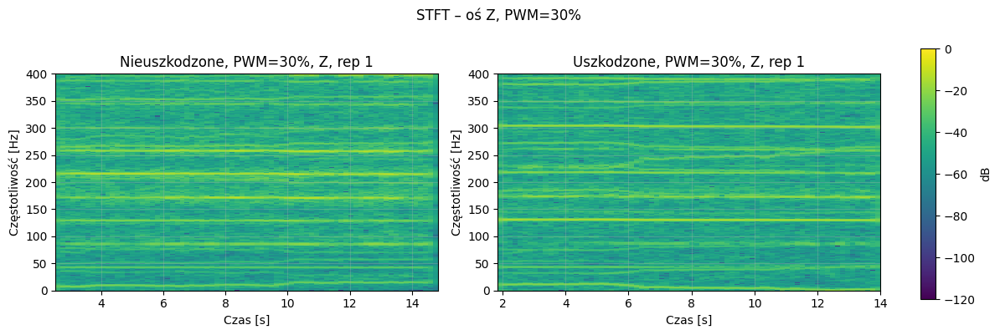


=== ANALIZA RÓŻNIC DLA Z ===
Pasmo 0-50Hz: różnica = +2.0 dB (1.59x)
Pasmo 50-150Hz: różnica = -1.0 dB (0.80x)
Pasmo 150-300Hz: różnica = -3.6 dB (0.44x)
Pasmo 300-400Hz: różnica = -0.1 dB (0.99x)
Największa różnica: -23.8 dB przy 257.3 Hz

--- Oś Magnitude ---


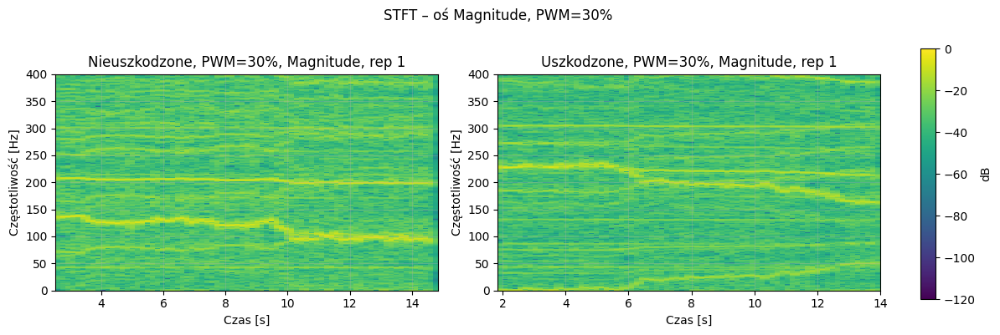


=== ANALIZA RÓŻNIC DLA Magnitude ===
Pasmo 0-50Hz: różnica = +1.0 dB (1.26x)
Pasmo 50-150Hz: różnica = -5.1 dB (0.31x)
Pasmo 150-300Hz: różnica = -0.6 dB (0.88x)
Pasmo 300-400Hz: różnica = -3.1 dB (0.49x)
Największa różnica: -18.0 dB przy 699.5 Hz

ANALIZA STFT DLA PWM = 40%

--- Oś X ---


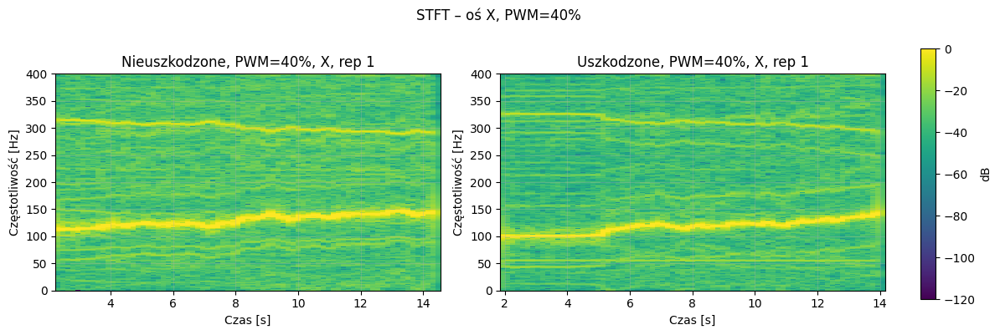


=== ANALIZA RÓŻNIC DLA X ===
Pasmo 0-50Hz: różnica = -1.8 dB (0.67x)
Pasmo 50-150Hz: różnica = -2.2 dB (0.61x)
Pasmo 150-300Hz: różnica = -4.5 dB (0.36x)
Pasmo 300-400Hz: różnica = -2.3 dB (0.59x)
Największa różnica: -17.3 dB przy 140.7 Hz

--- Oś Y ---


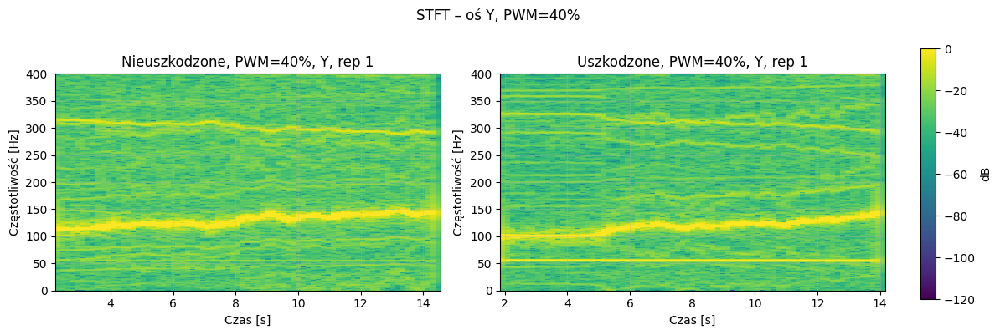


=== ANALIZA RÓŻNIC DLA Y ===
Pasmo 0-50Hz: różnica = -1.9 dB (0.65x)
Pasmo 50-150Hz: różnica = -0.6 dB (0.88x)
Pasmo 150-300Hz: różnica = -3.2 dB (0.48x)
Pasmo 300-400Hz: różnica = -1.0 dB (0.79x)
Największa różnica: +20.6 dB przy 56.3 Hz

--- Oś Z ---


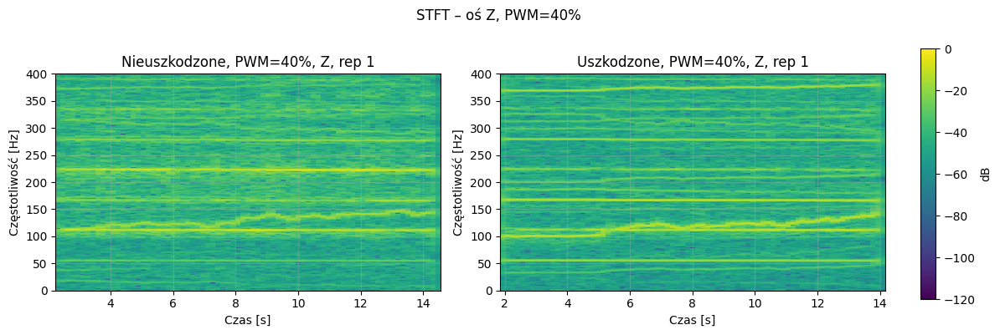


=== ANALIZA RÓŻNIC DLA Z ===
Pasmo 0-50Hz: różnica = -2.5 dB (0.56x)
Pasmo 50-150Hz: różnica = -0.2 dB (0.95x)
Pasmo 150-300Hz: różnica = -5.1 dB (0.31x)
Pasmo 300-400Hz: różnica = -1.5 dB (0.71x)
Największa różnica: -16.9 dB przy 221.1 Hz

--- Oś Magnitude ---


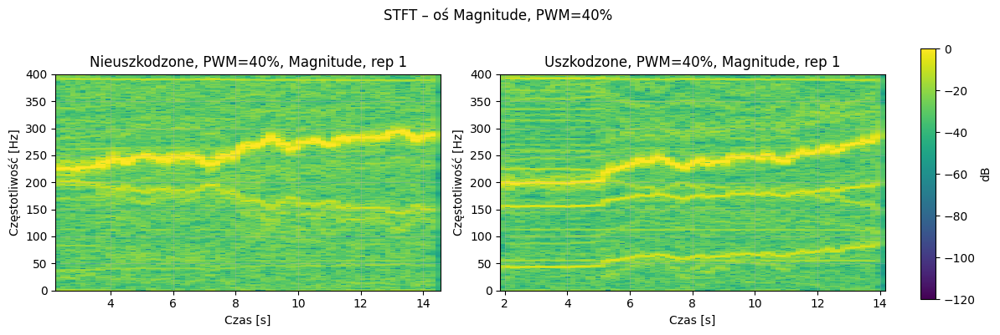


=== ANALIZA RÓŻNIC DLA Magnitude ===
Pasmo 0-50Hz: różnica = -1.3 dB (0.74x)
Pasmo 50-150Hz: różnica = -0.3 dB (0.92x)
Pasmo 150-300Hz: różnica = -1.6 dB (0.69x)
Pasmo 300-400Hz: różnica = -0.3 dB (0.92x)
Największa różnica: -10.1 dB przy 800.0 Hz

ANALIZA STFT DLA PWM = 50%

--- Oś X ---


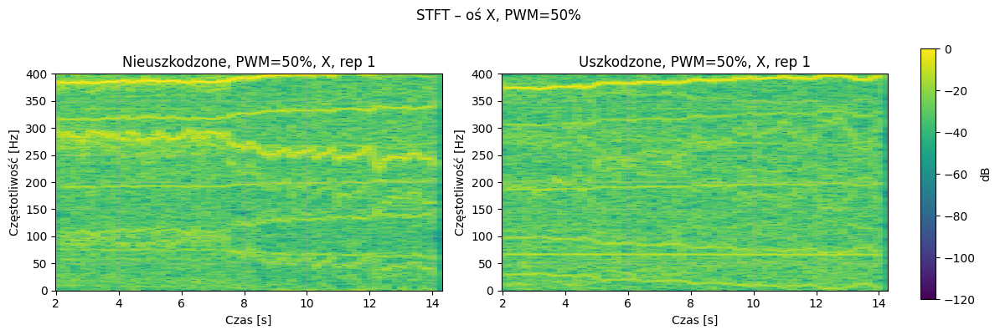


=== ANALIZA RÓŻNIC DLA X ===
Pasmo 0-50Hz: różnica = +2.7 dB (1.88x)
Pasmo 50-150Hz: różnica = +1.3 dB (1.35x)
Pasmo 150-300Hz: różnica = -1.8 dB (0.66x)
Pasmo 300-400Hz: różnica = -1.5 dB (0.70x)
Największa różnica: -15.9 dB przy 603.0 Hz

--- Oś Y ---


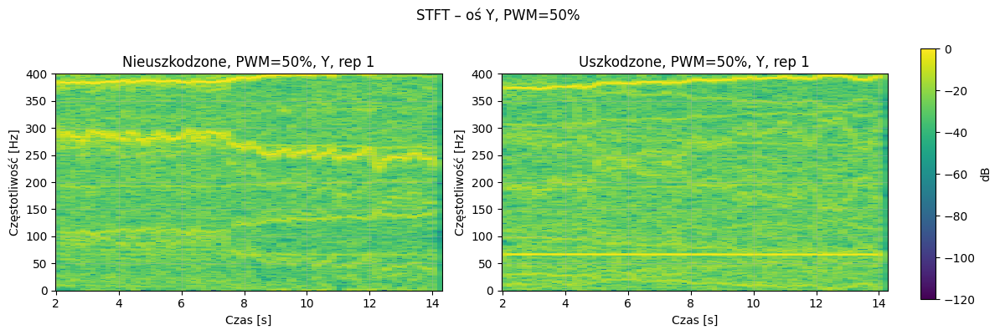


=== ANALIZA RÓŻNIC DLA Y ===
Pasmo 0-50Hz: różnica = +3.6 dB (2.31x)
Pasmo 50-150Hz: różnica = +2.2 dB (1.67x)
Pasmo 150-300Hz: różnica = -1.1 dB (0.78x)
Pasmo 300-400Hz: różnica = -0.6 dB (0.87x)
Największa różnica: +16.5 dB przy 68.3 Hz

--- Oś Z ---


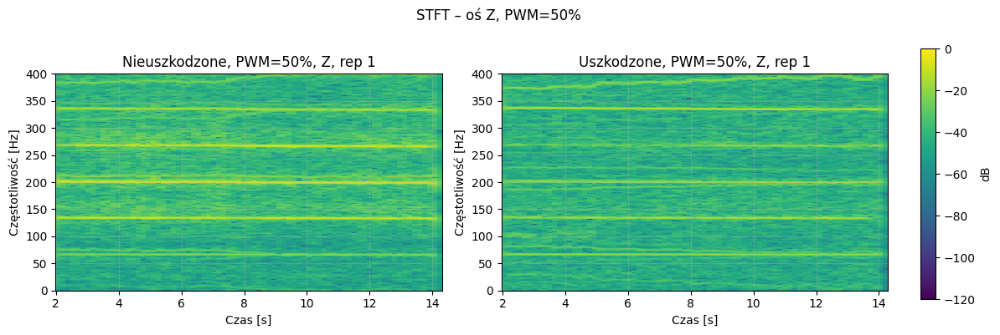


=== ANALIZA RÓŻNIC DLA Z ===
Pasmo 0-50Hz: różnica = +1.5 dB (1.40x)
Pasmo 50-150Hz: różnica = -0.5 dB (0.89x)
Pasmo 150-300Hz: różnica = -6.4 dB (0.23x)
Pasmo 300-400Hz: różnica = -2.0 dB (0.63x)
Największa różnica: -17.2 dB przy 209.0 Hz

--- Oś Magnitude ---


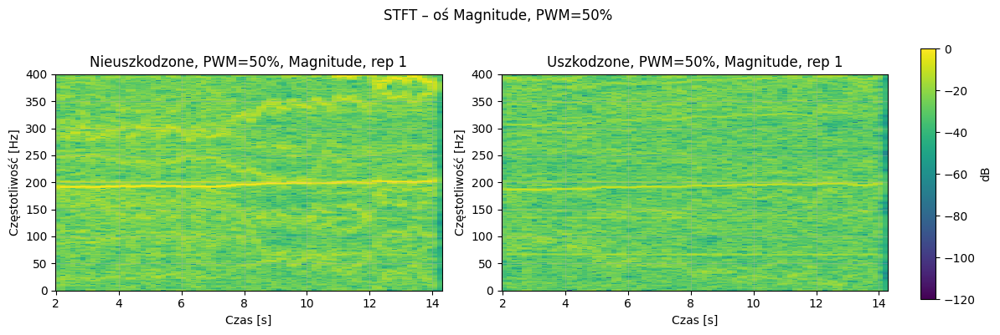


=== ANALIZA RÓŻNIC DLA Magnitude ===
Pasmo 0-50Hz: różnica = -1.9 dB (0.64x)
Pasmo 50-150Hz: różnica = -2.2 dB (0.60x)
Pasmo 150-300Hz: różnica = -4.0 dB (0.40x)
Pasmo 300-400Hz: różnica = -2.6 dB (0.54x)
Największa różnica: -12.0 dB przy 466.3 Hz


In [32]:
# Komórka 3 - Porównanie STFT dla osi X, Y, Z i magnitude
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import warnings
warnings.filterwarnings('ignore')

plt.rcParams["figure.figsize"] = (12, 4)

pwm_values = [20, 30, 40, 50]

# --- RĘCZNIE USTAWIANA POZYCJA COLORBARA ---
CBAR_LEFT   = 0.92   # pozycja w osi X (0-1)
CBAR_BOTTOM = 0.12   # pozycja w osi Y (0-1)
CBAR_WIDTH  = 0.015  # szerokość
CBAR_HEIGHT = 0.75   # wysokość
# ---------------------------------------------------------------

def plot_stft_axis(ax, t, f, Z_db, title, vmin=-120, vmax=0):
    """Rysuje STFT na podanej osi w oryginalnym stylu."""
    im = ax.pcolormesh(
        t, f, Z_db,
        shading="auto", 
        vmin=vmin, 
        vmax=vmax, 
        cmap='viridis'
    )
    ax.set_ylim(0, 400)
    ax.set_xlabel("Czas [s]")
    ax.set_ylabel("Częstotliwość [Hz]")
    ax.set_title(title)
    ax.grid(alpha=0.3)
    return im

for pwm in pwm_values:
    print(f"\n{'='*60}")
    print(f"ANALIZA STFT DLA PWM = {pwm}%")
    print(f"{'='*60}")
    
    ok_df = files_df[
        (files_df["condition"] == "nieuszkodzone") &
        (files_df["pwm"] == pwm)
    ].sort_values("rep")

    dmg_df = files_df[
        (files_df["condition"] == "uszkodzone") &
        (files_df["pwm"] == pwm)
    ].sort_values("rep")

    if ok_df.empty or dmg_df.empty:
        print(f"Brak kompletu danych dla PWM={pwm}%")
        continue

    # Weź tylko pierwszy rep z każdego
    rep_ok = ok_df.iloc[0]["rep"]
    rep_dmg = dmg_df.iloc[0]["rep"]
    
    # Nieuszkodzone
    row_ok = ok_df[ok_df["rep"] == rep_ok].iloc[0]
    path_ok = row_ok["path"]
    t_ok, ax_ok, ay_ok, az_ok, rpm_ok, Fs_ok = load_data_from_csv(path_ok)
    t_seg_ok, ax_seg_ok, ay_seg_ok, az_seg_ok, (t_start_ok, t_end_ok), mag_ok, mag_smooth_ok, thresh_ok = \
        detect_steady_window(t_ok, ax_ok, ay_ok, az_ok)
    
    # Oblicz magnitude
    mag_seg_ok = np.sqrt(ax_seg_ok**2 + ay_seg_ok**2 + az_seg_ok**2)

    # Uszkodzone
    row_dmg = dmg_df[dmg_df["rep"] == rep_dmg].iloc[0]
    path_dmg = row_dmg["path"]
    t_d, ax_d, ay_d, az_d, rpm_d, Fs_d = load_data_from_csv(path_dmg)
    t_seg_d, ax_seg_d, ay_seg_d, az_seg_d, (t_start_d, t_end_d), mag_d, mag_smooth_d, thresh_d = \
        detect_steady_window(t_d, ax_d, ay_d, az_d)
    
    # Oblicz magnitude
    mag_seg_dmg = np.sqrt(ax_seg_d**2 + ay_seg_d**2 + az_seg_d**2)
    
    # Analizujemy wszystkie osi + magnitude
    axes_to_analyze = [
        ('X', ax_seg_ok, ax_seg_d),
        ('Y', ay_seg_ok, ay_seg_d),
        ('Z', az_seg_ok, az_seg_d),
        ('Magnitude', mag_seg_ok, mag_seg_dmg)
    ]
    
    for axis_name, signal_ok, signal_dmg in axes_to_analyze:
        print(f"\n--- Oś {axis_name} ---")
        
        # Oblicz STFT
        y_ok = signal_ok - signal_ok.mean()
        f_ok, tt_ok, Z_ok = stft(
            y_ok, fs=Fs_ok,
            window="hann",
            nperseg=1024,
            noverlap=768
        )
        Zok_db = 20 * np.log10(np.abs(Z_ok) + 1e-12)
        
        y_d = signal_dmg - signal_dmg.mean()
        f_d, tt_d, Z_d = stft(
            y_d, fs=Fs_d,
            window="hann",
            nperseg=1024,
            noverlap=768
        )
        Zd_db = 20 * np.log10(np.abs(Z_d) + 1e-12)

        # Utwórz wykres
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        
        # NIEUSZKODZONE
        ax_left = axes[0]
        im = plot_stft_axis(
            ax_left,
            tt_ok + t_seg_ok[0], 
            f_ok, 
            Zok_db,
            f"Nieuszkodzone, PWM={pwm}%, {axis_name}, rep {rep_ok}"
        )
        
        # USZKODZONE
        ax_right = axes[1]
        im = plot_stft_axis(
            ax_right,
            tt_d + t_seg_d[0], 
            f_d, 
            Zd_db,
            f"Uszkodzone, PWM={pwm}%, {axis_name}, rep {rep_dmg}"
        )
        
        # Colorbar
        cbar_ax = fig.add_axes([CBAR_LEFT, CBAR_BOTTOM, CBAR_WIDTH, CBAR_HEIGHT])
        cbar = fig.colorbar(im, cax=cbar_ax)
        cbar.set_label("dB")

        fig.suptitle(
            f"STFT – oś {axis_name}, PWM={pwm}%",
            y=0.99
        )
        fig.tight_layout(rect=[0, 0, 0.9, 0.97])
        plt.show()
        
        # Analiza różnic w energii
        print(f"\n=== ANALIZA RÓŻNIC DLA {axis_name} ===")
        
        # Oblicz średnie widmo z STFT
        mean_spec_ok = np.mean(Zok_db, axis=1)
        mean_spec_dmg = np.mean(Zd_db, axis=1)
        
        # Pasma częstotliwości
        bands = [(0, 50), (50, 150), (150, 300), (300, 400)]
        for f_low, f_high in bands:
            mask = (f_ok >= f_low) & (f_ok <= f_high)
            if np.any(mask):
                energy_ok = np.mean(mean_spec_ok[mask])
                energy_dmg = np.mean(mean_spec_dmg[mask])
                diff = energy_dmg - energy_ok
                
                # Konwertuj do skali liniowej dla ratio
                energy_ok_lin = 10**(energy_ok/10)
                energy_dmg_lin = 10**(energy_dmg/10)
                ratio = energy_dmg_lin / energy_ok_lin if energy_ok_lin > 0 else 1
                
                print(f"Pasmo {f_low}-{f_high}Hz: różnica = {diff:+.1f} dB ({ratio:.2f}x)")
        
        # Znajdź największą różnicę
        # Interpoluj do wspólnej siatki częstotliwości
        f_min = max(f_ok[0], f_d[0])
        f_max = min(f_ok[-1], f_d[-1])
        f_common = np.linspace(f_min, f_max, 200)
        
        spec_interp_ok = np.interp(f_common, f_ok, mean_spec_ok)
        spec_interp_dmg = np.interp(f_common, f_d, mean_spec_dmg)
        
        diff = spec_interp_dmg - spec_interp_ok
        max_diff_idx = np.argmax(np.abs(diff))
        max_diff_freq = f_common[max_diff_idx]
        max_diff_value = diff[max_diff_idx]
        
        print(f"Największa różnica: {max_diff_value:+.1f} dB przy {max_diff_freq:.1f} Hz")

In [33]:
# Komórka 4 - Liczenie parametrów CWT z wybraną falką (cmor3.5-2.0)
import numpy as np
import pywt

# Ustalamy wybraną falkę
BEST_WAVELET = "cmor3.5-2.0"
print(f"Używana falka: {BEST_WAVELET}")

def compute_cwt_freq_y(y, Fs, fmin=0.5, fmax=400, n_freqs=256, normalize=True):
    """Oblicza CWT z wybraną falką cmor3.5-2.0."""
    y = y - y.mean()
    if normalize:
        rms = np.sqrt((y**2).mean())
        if rms > 0:
            y = y / rms

    dt = 1.0 / Fs
    freqs = np.linspace(fmin, fmax, n_freqs)
    scales = pywt.frequency2scale(BEST_WAVELET, freqs * dt)

    coeffs, _ = pywt.cwt(y, scales, BEST_WAVELET, sampling_period=dt)
    power = np.abs(coeffs)
    power_db = 20 * np.log10(power + 1e-12)
    return freqs, power_db


conditions = ["nieuszkodzone", "uszkodzone"]
pwm_values = [20, 30, 40, 50]

cwt_Y = {cond: {p: [] for p in pwm_values} for cond in conditions}

for cond in conditions:
    for pwm in pwm_values:
        subset = files_df[
            (files_df["condition"] == cond) &
            (files_df["pwm"] == pwm) &
            (files_df["rep"] <= 4)      # tylko rep 1–4 (trening / analiza)
        ].sort_values("rep")

        if subset.empty:
            print(f"Brak plików dla {cond}, PWM={pwm}% (rep 1-4)")
            continue

        for _, row in subset.iterrows():
            path = row["path"]
            t, ax, ay, az, rpm, Fs = load_data_from_csv(path)
            t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh = \
                detect_steady_window(t, ax, ay, az)

            y_seg = ay_seg

            freqs, power_db = compute_cwt_freq_y(
                y_seg, Fs,
                fmin=0.5,
                fmax=400,
                n_freqs=256
            )

            cwt_Y[cond][pwm].append({
                "meta": row,
                "Fs": Fs,
                "t": t_seg,
                "y": y_seg,
                "freqs": freqs,
                "power_db": power_db,
                "t_start": t_start,
                "t_end": t_end,
            })

print("Gotowe: policzono CWT dla osi Y (stany śmigła, PWM, rep 1-4).")

Używana falka: cmor3.5-2.0
Gotowe: policzono CWT dla osi Y (stany śmigła, PWM, rep 1-4).


Analiza CWT z falką: cmor3.5-2.0

ANALIZA CWT DLA PWM = 20%

--- Oś X ---


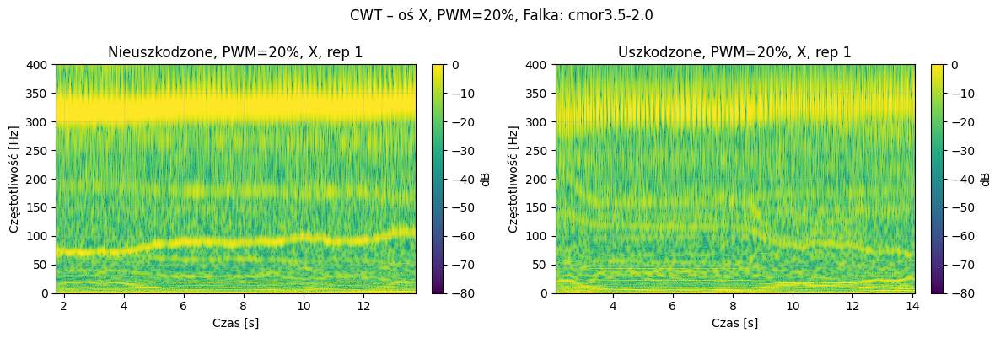


=== ANALIZA RÓŻNIC DLA X ===
Pasmo 0-50Hz: różnica = +1.7 dB (1.48x)
Pasmo 50-150Hz: różnica = -0.1 dB (0.99x)
Pasmo 150-300Hz: różnica = -0.7 dB (0.85x)
Pasmo 300-400Hz: różnica = -3.9 dB (0.41x)
Największa różnica: -7.7 dB przy 90.8 Hz

--- Oś Y ---


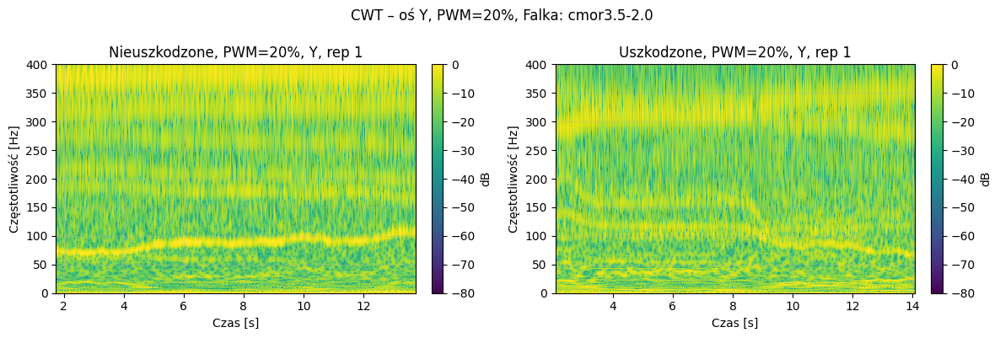


=== ANALIZA RÓŻNIC DLA Y ===
Pasmo 0-50Hz: różnica = +2.3 dB (1.72x)
Pasmo 50-150Hz: różnica = +1.7 dB (1.48x)
Pasmo 150-300Hz: różnica = -1.3 dB (0.75x)
Pasmo 300-400Hz: różnica = -5.0 dB (0.32x)
Największa różnica: -15.4 dB przy 390.0 Hz

--- Oś Z ---


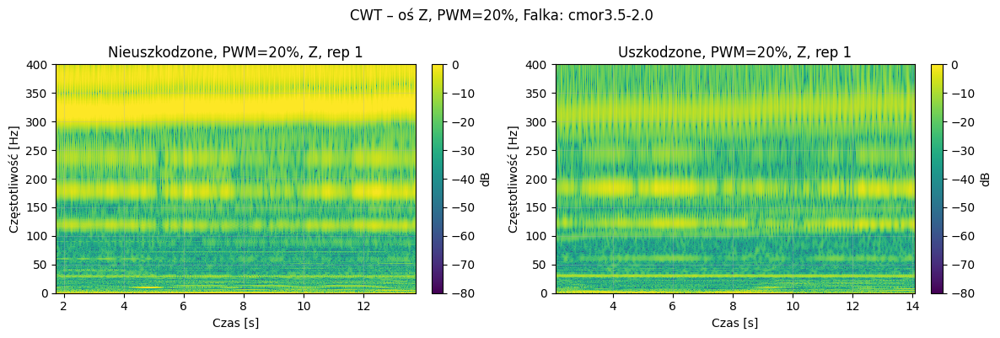


=== ANALIZA RÓŻNIC DLA Z ===
Pasmo 0-50Hz: różnica = -0.7 dB (0.85x)
Pasmo 50-150Hz: różnica = +0.6 dB (1.14x)
Pasmo 150-300Hz: różnica = -3.2 dB (0.48x)
Pasmo 300-400Hz: różnica = -13.5 dB (0.05x)
Największa różnica: -19.5 dB przy 379.9 Hz

--- Oś Magnitude ---


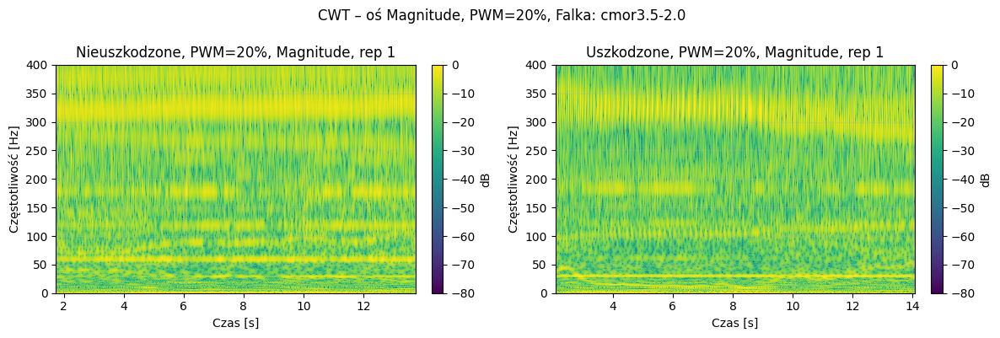


=== ANALIZA RÓŻNIC DLA Magnitude ===
Pasmo 0-50Hz: różnica = +1.5 dB (1.42x)
Pasmo 50-150Hz: różnica = -2.8 dB (0.52x)
Pasmo 150-300Hz: różnica = -2.0 dB (0.64x)
Pasmo 300-400Hz: różnica = -4.8 dB (0.33x)
Największa różnica: -13.4 dB przy 58.7 Hz

ANALIZA CWT DLA PWM = 30%

--- Oś X ---


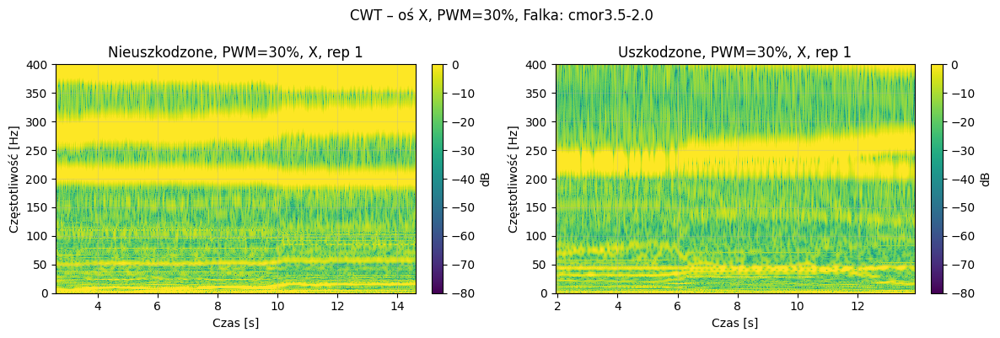


=== ANALIZA RÓŻNIC DLA X ===
Pasmo 0-50Hz: różnica = +1.2 dB (1.33x)
Pasmo 50-150Hz: różnica = -1.4 dB (0.72x)
Pasmo 150-300Hz: różnica = -2.0 dB (0.64x)
Pasmo 300-400Hz: różnica = -15.1 dB (0.03x)
Największa różnica: -24.0 dB przy 385.9 Hz

--- Oś Y ---


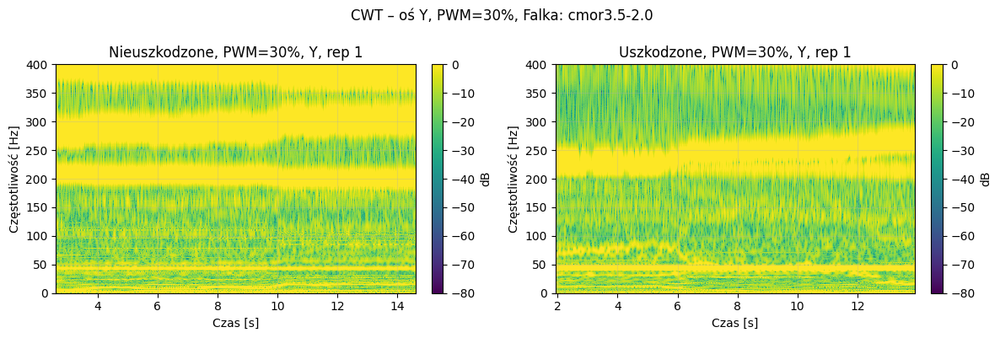


=== ANALIZA RÓŻNIC DLA Y ===
Pasmo 0-50Hz: różnica = +2.6 dB (1.81x)
Pasmo 50-150Hz: różnica = +0.2 dB (1.04x)
Pasmo 150-300Hz: różnica = -2.7 dB (0.53x)
Pasmo 300-400Hz: różnica = -14.6 dB (0.03x)
Największa różnica: -22.6 dB przy 299.6 Hz

--- Oś Z ---


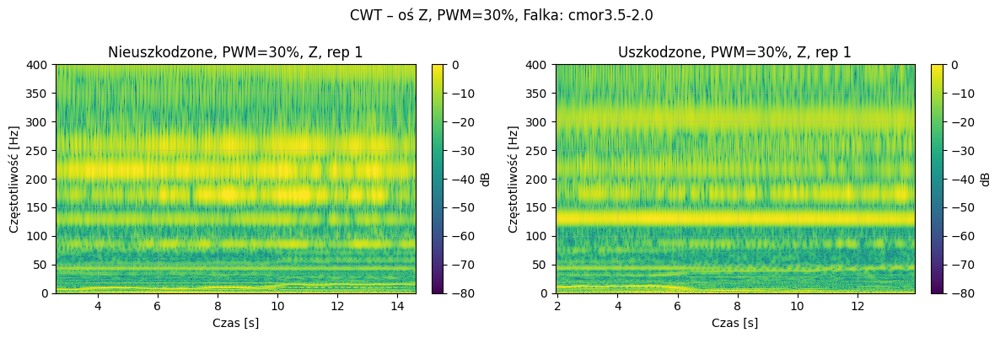


=== ANALIZA RÓŻNIC DLA Z ===
Pasmo 0-50Hz: różnica = +0.2 dB (1.05x)
Pasmo 50-150Hz: różnica = +0.6 dB (1.16x)
Pasmo 150-300Hz: różnica = -4.4 dB (0.36x)
Pasmo 300-400Hz: różnica = +2.1 dB (1.61x)
Największa różnica: +13.3 dB przy 309.7 Hz

--- Oś Magnitude ---


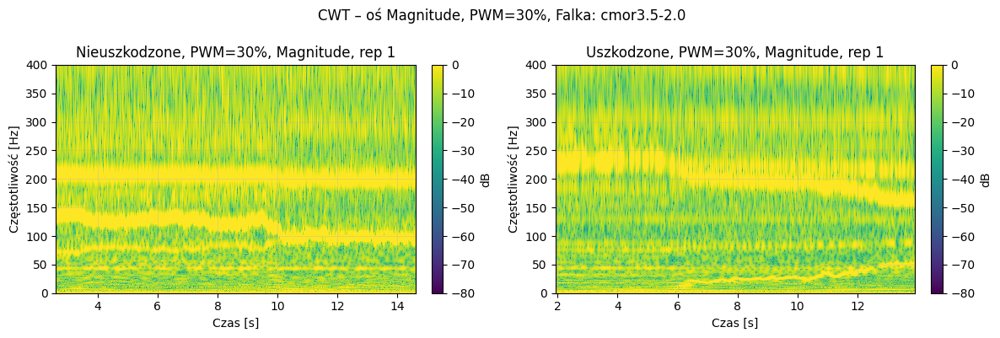


=== ANALIZA RÓŻNIC DLA Magnitude ===
Pasmo 0-50Hz: różnica = -0.1 dB (0.97x)
Pasmo 50-150Hz: różnica = -6.2 dB (0.24x)
Pasmo 150-300Hz: różnica = -0.1 dB (0.98x)
Pasmo 300-400Hz: różnica = -1.1 dB (0.78x)
Największa różnica: -12.2 dB przy 118.9 Hz

ANALIZA CWT DLA PWM = 40%

--- Oś X ---


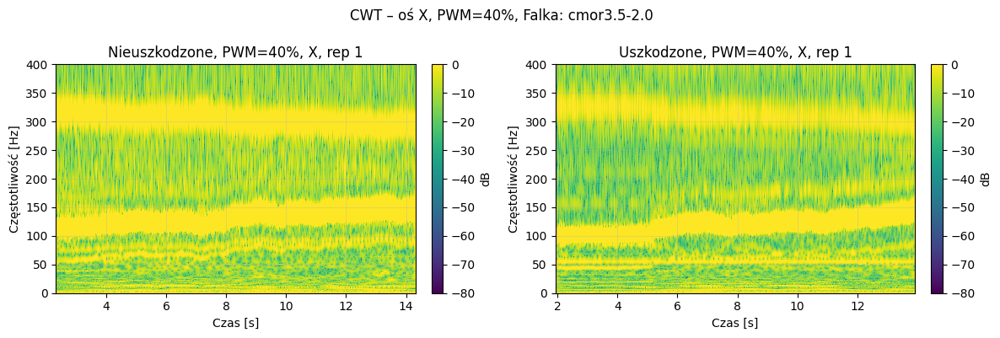


=== ANALIZA RÓŻNIC DLA X ===
Pasmo 0-50Hz: różnica = -0.6 dB (0.88x)
Pasmo 50-150Hz: różnica = -1.5 dB (0.72x)
Pasmo 150-300Hz: różnica = -4.9 dB (0.32x)
Pasmo 300-400Hz: różnica = -1.1 dB (0.78x)
Największa różnica: -15.0 dB przy 145.0 Hz

--- Oś Y ---


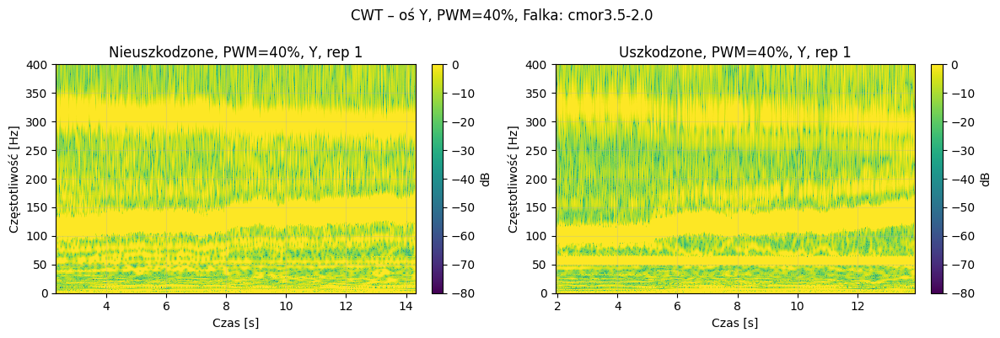


=== ANALIZA RÓŻNIC DLA Y ===
Pasmo 0-50Hz: różnica = -1.0 dB (0.80x)
Pasmo 50-150Hz: różnica = +1.1 dB (1.28x)
Pasmo 150-300Hz: różnica = -3.0 dB (0.51x)
Pasmo 300-400Hz: różnica = -0.1 dB (0.98x)
Największa różnica: +20.2 dB przy 56.7 Hz

--- Oś Z ---


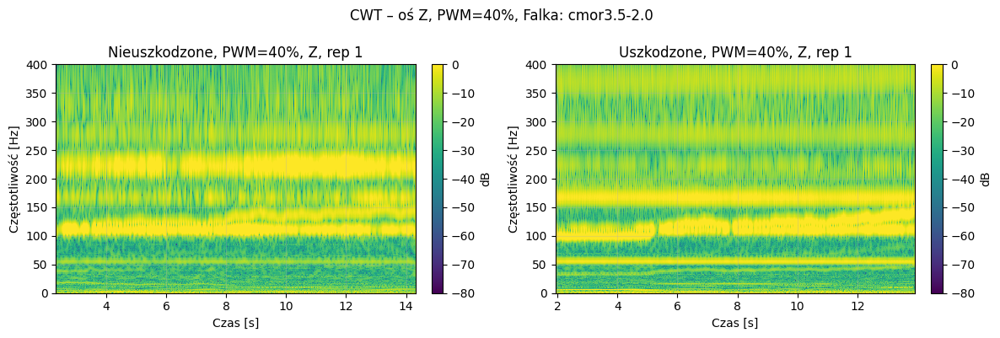


=== ANALIZA RÓŻNIC DLA Z ===
Pasmo 0-50Hz: różnica = +0.9 dB (1.24x)
Pasmo 50-150Hz: różnica = +1.2 dB (1.33x)
Pasmo 150-300Hz: różnica = -2.1 dB (0.61x)
Pasmo 300-400Hz: różnica = +4.3 dB (2.70x)
Największa różnica: -13.7 dB przy 225.3 Hz

--- Oś Magnitude ---


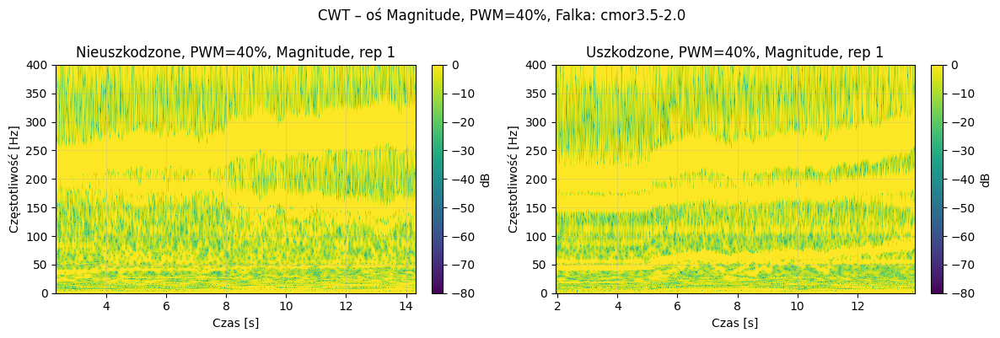


=== ANALIZA RÓŻNIC DLA Magnitude ===
Pasmo 0-50Hz: różnica = -0.6 dB (0.87x)
Pasmo 50-150Hz: różnica = +0.9 dB (1.22x)
Pasmo 150-300Hz: różnica = -0.0 dB (0.99x)
Pasmo 300-400Hz: różnica = -0.6 dB (0.88x)
Największa różnica: -10.1 dB przy 281.6 Hz

ANALIZA CWT DLA PWM = 50%

--- Oś X ---


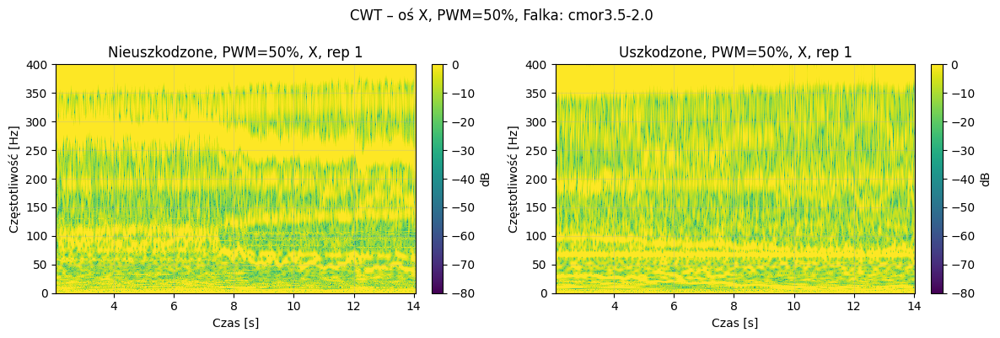


=== ANALIZA RÓŻNIC DLA X ===
Pasmo 0-50Hz: różnica = +1.6 dB (1.43x)
Pasmo 50-150Hz: różnica = +0.9 dB (1.22x)
Pasmo 150-300Hz: różnica = -3.0 dB (0.50x)
Pasmo 300-400Hz: różnica = -2.8 dB (0.53x)
Największa różnica: +9.9 dB przy 66.7 Hz

--- Oś Y ---


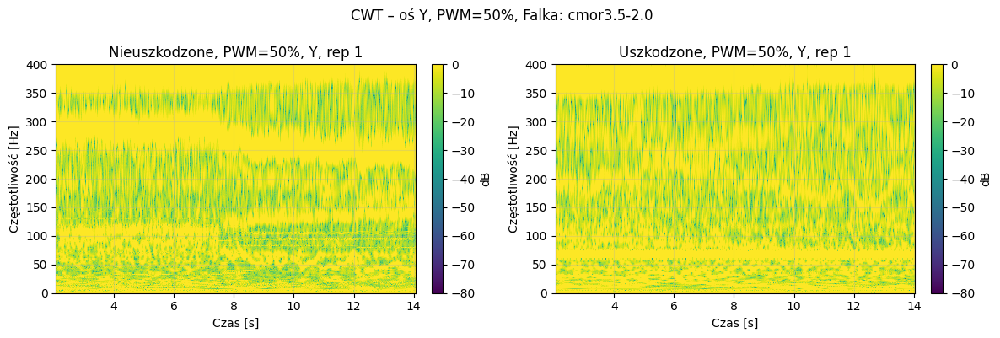


=== ANALIZA RÓŻNIC DLA Y ===
Pasmo 0-50Hz: różnica = +2.4 dB (1.72x)
Pasmo 50-150Hz: różnica = +2.5 dB (1.78x)
Pasmo 150-300Hz: różnica = -2.4 dB (0.58x)
Pasmo 300-400Hz: różnica = +0.0 dB (1.01x)
Największa różnica: +17.1 dB przy 66.7 Hz

--- Oś Z ---


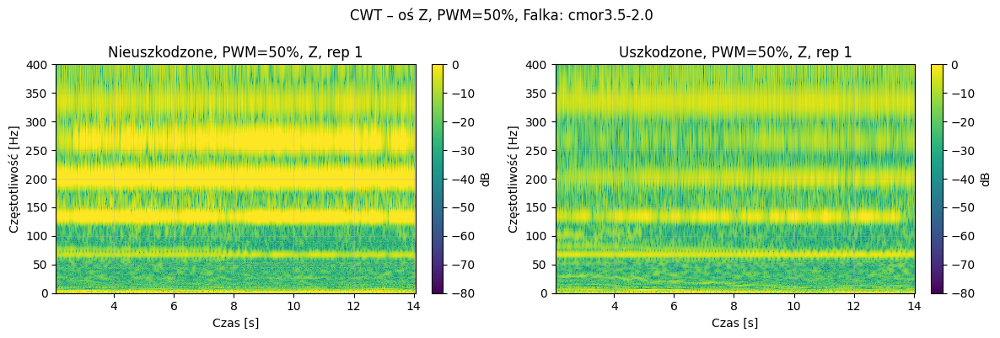


=== ANALIZA RÓŻNIC DLA Z ===
Pasmo 0-50Hz: różnica = +0.2 dB (1.05x)
Pasmo 50-150Hz: różnica = -1.1 dB (0.78x)
Pasmo 150-300Hz: różnica = -10.2 dB (0.10x)
Pasmo 300-400Hz: różnica = -0.0 dB (0.99x)
Największa różnica: -14.4 dB przy 263.5 Hz

--- Oś Magnitude ---


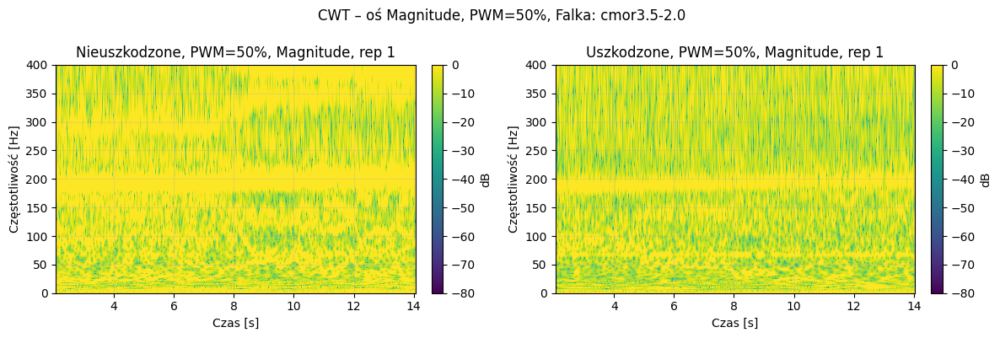


=== ANALIZA RÓŻNIC DLA Magnitude ===
Pasmo 0-50Hz: różnica = -2.3 dB (0.59x)
Pasmo 50-150Hz: różnica = -2.1 dB (0.62x)
Pasmo 150-300Hz: różnica = -5.2 dB (0.30x)
Pasmo 300-400Hz: różnica = -4.3 dB (0.37x)
Największa różnica: -9.9 dB przy 203.3 Hz


In [34]:
# Komórka 5 - Porównanie CWT dla osi X, Y, Z i magnitude
import numpy as np
import matplotlib.pyplot as plt

vmin, vmax = -80, 0  # zakres dB do skalogramów

print(f"Analiza CWT z falką: {BEST_WAVELET}")

# Funkcja do obliczania CWT dla dowolnego sygnału
def compute_cwt_for_signal(signal, Fs, fmin=0.5, fmax=400, n_freqs=256):
    """Oblicza CWT dla dowolnego sygnału."""
    return compute_cwt_freq_y(signal, Fs, fmin, fmax, n_freqs, normalize=False)

pwm_values = [20, 30, 40, 50]

for pwm in pwm_values:
    print(f"\n{'='*60}")
    print(f"ANALIZA CWT DLA PWM = {pwm}%")
    print(f"{'='*60}")
    
    ok_df = files_df[
        (files_df["condition"] == "nieuszkodzone") &
        (files_df["pwm"] == pwm)
    ].sort_values("rep")

    dmg_df = files_df[
        (files_df["condition"] == "uszkodzone") &
        (files_df["pwm"] == pwm)
    ].sort_values("rep")

    if ok_df.empty or dmg_df.empty:
        print(f"Brak kompletu danych dla PWM={pwm}%")
        continue

    # Weź tylko pierwszy rep z każdego
    rep_ok = ok_df.iloc[0]["rep"]
    rep_dmg = dmg_df.iloc[0]["rep"]
    
    # Nieuszkodzone
    row_ok = ok_df[ok_df["rep"] == rep_ok].iloc[0]
    path_ok = row_ok["path"]
    t_ok, ax_ok, ay_ok, az_ok, rpm_ok, Fs_ok = load_data_from_csv(path_ok)
    t_seg_ok, ax_seg_ok, ay_seg_ok, az_seg_ok, (t_start_ok, t_end_ok), mag_ok, mag_smooth_ok, thresh_ok = \
        detect_steady_window(t_ok, ax_ok, ay_ok, az_ok)
    
    # Oblicz magnitude
    mag_seg_ok = np.sqrt(ax_seg_ok**2 + ay_seg_ok**2 + az_seg_ok**2)

    # Uszkodzone
    row_dmg = dmg_df[dmg_df["rep"] == rep_dmg].iloc[0]
    path_dmg = row_dmg["path"]
    t_d, ax_d, ay_d, az_d, rpm_d, Fs_d = load_data_from_csv(path_dmg)
    t_seg_d, ax_seg_d, ay_seg_d, az_seg_d, (t_start_d, t_end_d), mag_d, mag_smooth_d, thresh_d = \
        detect_steady_window(t_d, ax_d, ay_d, az_d)
    
    # Oblicz magnitude
    mag_seg_dmg = np.sqrt(ax_seg_d**2 + ay_seg_d**2 + az_seg_d**2)
    
    # Analizujemy wszystkie osi + magnitude
    axes_to_analyze = [
        ('X', ax_seg_ok, ax_seg_d),
        ('Y', ay_seg_ok, ay_seg_d),
        ('Z', az_seg_ok, az_seg_d),
        ('Magnitude', mag_seg_ok, mag_seg_dmg)
    ]
    
    for axis_name, signal_ok, signal_dmg in axes_to_analyze:
        print(f"\n--- Oś {axis_name} ---")
        
        # Oblicz CWT
        freqs_ok, power_db_ok = compute_cwt_for_signal(signal_ok, Fs_ok)
        freqs_dmg, power_db_dmg = compute_cwt_for_signal(signal_dmg, Fs_d)
        
        # Utwórz wykres
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        
        # NIEUSZKODZONE
        ax_left = axes[0]
        im_left = ax_left.pcolormesh(
            t_seg_ok, freqs_ok, power_db_ok,
            shading="auto", vmin=vmin, vmax=vmax, cmap='viridis'
        )
        ax_left.set_ylim(0, 400)
        ax_left.set_xlabel("Czas [s]")
        ax_left.set_ylabel("Częstotliwość [Hz]")
        ax_left.set_title(f"Nieuszkodzone, PWM={pwm}%, {axis_name}, rep {rep_ok}")
        ax_left.grid(alpha=0.3)
        
        # USZKODZONE
        ax_right = axes[1]
        im_right = ax_right.pcolormesh(
            t_seg_d, freqs_dmg, power_db_dmg,
            shading="auto", vmin=vmin, vmax=vmax, cmap='viridis'
        )
        ax_right.set_ylim(0, 400)
        ax_right.set_xlabel("Czas [s]")
        ax_right.set_ylabel("Częstotliwość [Hz]")
        ax_right.set_title(f"Uszkodzone, PWM={pwm}%, {axis_name}, rep {rep_dmg}")
        ax_right.grid(alpha=0.3)
        
        # Colorbar
        cbar_left = fig.colorbar(im_left, ax=ax_left, fraction=0.046, pad=0.04)
        cbar_left.set_label("dB")
        cbar_right = fig.colorbar(im_right, ax=ax_right, fraction=0.046, pad=0.04)
        cbar_right.set_label("dB")

        fig.suptitle(
            f"CWT – oś {axis_name}, PWM={pwm}%, Falka: {BEST_WAVELET}",
            y=0.99
        )
        plt.tight_layout()
        plt.show()
        
        # Analiza różnic w energii
        print(f"\n=== ANALIZA RÓŻNIC DLA {axis_name} ===")
        
        # Oblicz średnie widmo z CWT
        mean_spec_ok = np.mean(power_db_ok, axis=1)
        mean_spec_dmg = np.mean(power_db_dmg, axis=1)
        
        # Pasma częstotliwości
        bands = [(0, 50), (50, 150), (150, 300), (300, 400)]
        for f_low, f_high in bands:
            mask_ok = (freqs_ok >= f_low) & (freqs_ok <= f_high)
            mask_dmg = (freqs_dmg >= f_low) & (freqs_dmg <= f_high)
            
            if np.any(mask_ok) and np.any(mask_dmg):
                energy_ok = np.mean(mean_spec_ok[mask_ok])
                energy_dmg = np.mean(mean_spec_dmg[mask_dmg])
                diff = energy_dmg - energy_ok
                
                # Konwertuj do skali liniowej dla ratio
                energy_ok_lin = 10**(energy_ok/10)
                energy_dmg_lin = 10**(energy_dmg/10)
                ratio = energy_dmg_lin / energy_ok_lin if energy_ok_lin > 0 else 1
                
                print(f"Pasmo {f_low}-{f_high}Hz: różnica = {diff:+.1f} dB ({ratio:.2f}x)")
        
        # Znajdź największą różnicę
        # Interpoluj do wspólnej siatki częstotliwości
        f_min = max(freqs_ok[0], freqs_dmg[0])
        f_max = min(freqs_ok[-1], freqs_dmg[-1])
        f_common = np.linspace(f_min, f_max, 200)
        
        spec_interp_ok = np.interp(f_common, freqs_ok, mean_spec_ok)
        spec_interp_dmg = np.interp(f_common, freqs_dmg, mean_spec_dmg)
        
        diff = spec_interp_dmg - spec_interp_ok
        max_diff_idx = np.argmax(np.abs(diff))
        max_diff_freq = f_common[max_diff_idx]
        max_diff_value = diff[max_diff_idx]
        
        print(f"Największa różnica: {max_diff_value:+.1f} dB przy {max_diff_freq:.1f} Hz")

In [5]:
# Komórka 6 - Przygotowanie cech do modelu (TYLKO osie Y i Z)
import pandas as pd
import numpy as np
from scipy.stats import kurtosis, skew
from scipy.signal import welch
import pywt

print("=== EKSTRAKCJA CECH Z OSI Y i Z ===")
print("Używana falka: cmor3.5-1.0 (oryginalna)")

BEST_WAVELET = "cmor3.5-1.0"  # Wracamy do oryginalnej falki

# Uproszczone pasma częstotliwości
bands = [
    (0, 50),      # Niskie częstotliwości
    (50, 150),    # Średnie
    (150, 300),   # Wysokie
    (300, 400),   # Bardzo wysokie
]

def compute_cwt_simple(y, Fs, fmin=0.5, fmax=400, n_freqs=128):  # Mniej częstotliwości
    """Uproszczone CWT."""
    y = y - y.mean()
    
    dt = 1.0 / Fs
    freqs = np.linspace(fmin, fmax, n_freqs)
    scales = pywt.frequency2scale(BEST_WAVELET, freqs * dt)
    
    coeffs, _ = pywt.cwt(y, scales, BEST_WAVELET, sampling_period=dt)
    power = np.abs(coeffs)
    power_db = 20 * np.log10(power + 1e-12)
    
    return freqs, power_db

def extract_simple_features(signal, Fs, prefix=''):
    """Ekstrahuje tylko podstawowe cechy."""
    features = {}
    
    if len(signal) < 100:
        return features
    
    # 1. Cechy czasowe (4 najważniejsze)
    features[f'{prefix}mean'] = np.mean(signal)
    features[f'{prefix}std'] = np.std(signal)
    features[f'{prefix}skewness'] = skew(signal)
    features[f'{prefix}kurtosis'] = kurtosis(signal)
    features[f'{prefix}rms'] = np.sqrt(np.mean(signal**2))
    
    # 2. Cechy częstotliwościowe (FFT)
    freqs, psd = welch(signal, Fs, nperseg=min(512, len(signal)//2))  # Mniejszy FFT
    
    # Energia w 3 pasmach
    band_energies = {}
    band_limits = [(0, 50, 'low'), (50, 150, 'mid'), (150, 300, 'high')]
    
    for f_low, f_high, band_name in band_limits:
        mask = (freqs >= f_low) & (freqs <= f_high)
        if np.any(mask):
            band_power = np.trapz(psd[mask], freqs[mask])
            features[f'{prefix}{band_name}_energy'] = band_power
            
            # Pik w paśmie
            peak_idx = np.argmax(psd[mask])
            features[f'{prefix}{band_name}_peak_freq'] = freqs[mask][peak_idx]
    
    # 3. Cechy CWT (tylko najważniejsze)
    freqs_cwt, power_db = compute_cwt_simple(signal, Fs, n_freqs=128)
    
    # Stosunek energii wysokich do niskich częstotliwości
    mask_low = (freqs_cwt >= 0.5) & (freqs_cwt <= 50)
    mask_high = (freqs_cwt > 150) & (freqs_cwt <= 300)
    
    if np.any(mask_low) and np.any(mask_high):
        mean_spec = power_db.mean(axis=1)
        energy_low = np.mean(mean_spec[mask_low])
        energy_high = np.mean(mean_spec[mask_high])
        if energy_low != 0:
            features[f'{prefix}high_low_ratio'] = energy_high / energy_low
    
    # 4. Rozproszenie widmowe
    if np.sum(psd) > 0:
        centroid = np.sum(freqs * psd) / np.sum(psd)
        features[f'{prefix}spectral_spread'] = np.sqrt(
            np.sum((freqs - centroid)**2 * psd) / np.sum(psd)
        )
    
    return features

# Główna pętla ekstrakcji cech
rows = []

# Bierzemy tylko rep 1-4 (trening)
train_subset = files_df[files_df["rep"] <= 4].sort_values(
    ["condition", "pwm", "rep"]
)

print(f"Przetwarzanie {len(train_subset)} plików treningowych...")

for idx, row in train_subset.iterrows():
    if idx % 5 == 0:
        print(f"  Przetworzono {idx}/{len(train_subset)} plików...")
    
    path = row["path"]
    cond = row["condition"]
    pwm = row["pwm"]
    rep = row["rep"]
    
    try:
        # Wczytaj dane
        t, ax, ay, az, rpm_data, Fs = load_data_from_csv(path)
        
        # Detekcja okna pracy ustalonej
        t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh = \
            detect_steady_window(t, ax, ay, az)
        
        # Średnie RPM w oknie
        avg_rpm = None
        if rpm_data is not None:
            rpm_in_window = rpm_data[(t >= t_start) & (t <= t_end)]
            if len(rpm_in_window) > 0:
                avg_rpm = np.mean(rpm_in_window)
        
        # Dzielenie na 2 połówki
        N = len(ay_seg)
        if N < 100:
            continue
            
        mid = N // 2
        
        for part_idx in range(2):
            # Wybierz połówkę
            if part_idx == 0:
                ay_part = ay_seg[:mid]
                az_part = az_seg[:mid]
            else:
                ay_part = ay_seg[mid:]
                az_part = az_seg[mid:]
            
            # Ekstrakcja cech tylko z Y i Z
            features = {}
            
            # Oś Y (główna)
            y_features = extract_simple_features(ay_part, Fs, 'Y_')
            features.update(y_features)
            
            # Oś Z (pomocnicza)
            z_features = extract_simple_features(az_part, Fs, 'Z_')
            features.update(z_features)
            
            # Dodaj metadane
            row_feat = {
                "file_id": str(path),
                "condition": cond,
                "pwm": pwm,
                "rep": rep,
                "part": part_idx,
                "avg_rpm": avg_rpm if avg_rpm is not None else np.nan,
            }
            row_feat.update(features)
            
            rows.append(row_feat)
            
    except Exception as e:
        print(f"  Błąd przy przetwarzaniu {path}: {e}")
        continue

# Utwórz DataFrame
features_df = pd.DataFrame(rows)

# Sprawdź brakujące wartości
nan_count = features_df.isna().sum().sum()
print(f"\nLiczba brakujących wartości: {nan_count}")

# Usuń kolumny z dużą liczbą brakujących wartości
missing_threshold = 0.2 * len(features_df)
columns_to_drop = []
for col in features_df.columns:
    if col not in ["file_id", "condition", "pwm", "rep", "part", "avg_rpm"]:
        nan_count_col = features_df[col].isna().sum()
        if nan_count_col > missing_threshold:
            columns_to_drop.append(col)

if columns_to_drop:
    features_df = features_df.drop(columns=columns_to_drop)

# Uzupełnij pozostałe braki medianą
from sklearn.impute import SimpleImputer

numeric_cols = features_df.select_dtypes(include=[np.number]).columns.tolist()
meta_cols = ["file_id", "condition", "pwm", "rep", "part", "avg_rpm"]
feature_cols = [c for c in numeric_cols if c not in meta_cols]

if len(feature_cols) > 0:
    imputer = SimpleImputer(strategy='median')
    features_df[feature_cols] = imputer.fit_transform(features_df[feature_cols])

print(f"\n=== PODSUMOWANIE ===")
print(f"Liczba przykładów: {len(features_df)}")
print(f"Liczba cech: {len(feature_cols)}")
print(f"Rozkład klas: {features_df['condition'].value_counts().to_dict()}")

# Przykładowe cechy
print(f"\nPrzykładowe cechy (pierwsze 15):")
for feat in sorted(feature_cols)[:15]:
    print(f"  {feat}")

display(features_df.head())

=== EKSTRAKCJA CECH Z OSI Y i Z ===
Używana falka: cmor3.5-1.0 (oryginalna)
Przetwarzanie 32 plików treningowych...
  Przetworzono 0/32 plików...
  Przetworzono 5/32 plików...
  Przetworzono 10/32 plików...
  Przetworzono 15/32 plików...
  Przetworzono 20/32 plików...
  Przetworzono 25/32 plików...
  Przetworzono 30/32 plików...
  Przetworzono 35/32 plików...

Liczba brakujących wartości: 0

=== PODSUMOWANIE ===
Liczba przykładów: 64
Liczba cech: 26
Rozkład klas: {'nieuszkodzone': 32, 'uszkodzone': 32}

Przykładowe cechy (pierwsze 15):
  Y_high_energy
  Y_high_low_ratio
  Y_high_peak_freq
  Y_kurtosis
  Y_low_energy
  Y_low_peak_freq
  Y_mean
  Y_mid_energy
  Y_mid_peak_freq
  Y_rms
  Y_skewness
  Y_spectral_spread
  Y_std
  Z_high_energy
  Z_high_low_ratio


,file_id,condition,pwm,rep,part,avg_rpm,Y_mean,Y_std,Y_skewness,Y_kurtosis,...,Z_kurtosis,Z_rms,Z_low_energy,Z_low_peak_freq,Z_mid_energy,Z_mid_peak_freq,Z_high_energy,Z_high_peak_freq,Z_high_low_ratio,Z_spectral_spread
0,fabryczne_nieuszkodzone\pwm_20%\1_fabryczne_ni...,nieuszkodzone,20,1,0,1718.888964,0.012681,0.822577,-0.155627,-0.116126,...,-0.434573,1.268827,0.001191,31.250,0.008335,118.75,0.048114,178.125,0.510083,99.579657
1,fabryczne_nieuszkodzone\pwm_20%\1_fabryczne_ni...,nieuszkodzone,20,1,1,1718.888964,-0.006908,0.843198,-0.106811,-0.259200,...,-0.404889,1.261114,0.001080,28.125,0.009231,118.75,0.045225,178.125,0.544696,99.463670
2,fabryczne_nieuszkodzone\pwm_20%\2_fabryczne_ni...,nieuszkodzone,20,2,0,1709.043490,-0.007618,0.842591,-0.101828,-0.180961,...,-0.383611,1.290119,0.001104,28.125,0.016635,118.75,0.067100,178.125,0.484294,102.842240
3,fabryczne_nieuszkodzone\pwm_20%\2_fabryczne_ni...,nieuszkodzone,20,2,1,1709.043490,-0.004191,0.827418,-0.148864,-0.117444,...,-0.194518,1.301031,0.001198,28.125,0.037795,118.75,0.147709,175.000,0.386935,119.178888
4,fabryczne_nieuszkodzone\pwm_20%\3_fabryczne_ni...,nieuszkodzone,20,3,0,1707.194167,-0.009175,0.846139,-0.108225,-0.194883,...,-0.362960,1.330268,0.001196,28.125,0.021431,118.75,0.092336,178.125,0.440963,102.748215


=== PROSTY MODEL Z OSI Y i Z ===
Liczba cech: 26

Leave-one-PWM-out accuracy:
  Średnia: 0.844 ± 0.205
  Poszczególne: [1.    0.5   1.    0.875]

Top 10 najważniejszych cech:
          feature  importance
Z_spectral_spread    0.172189
           Y_mean    0.167933
 Z_high_low_ratio    0.127596
       Y_skewness    0.101432
     Z_low_energy    0.083610
 Y_high_low_ratio    0.071548
    Z_high_energy    0.070527
           Z_mean    0.036725
Y_spectral_spread    0.033144
 Z_high_peak_freq    0.029135


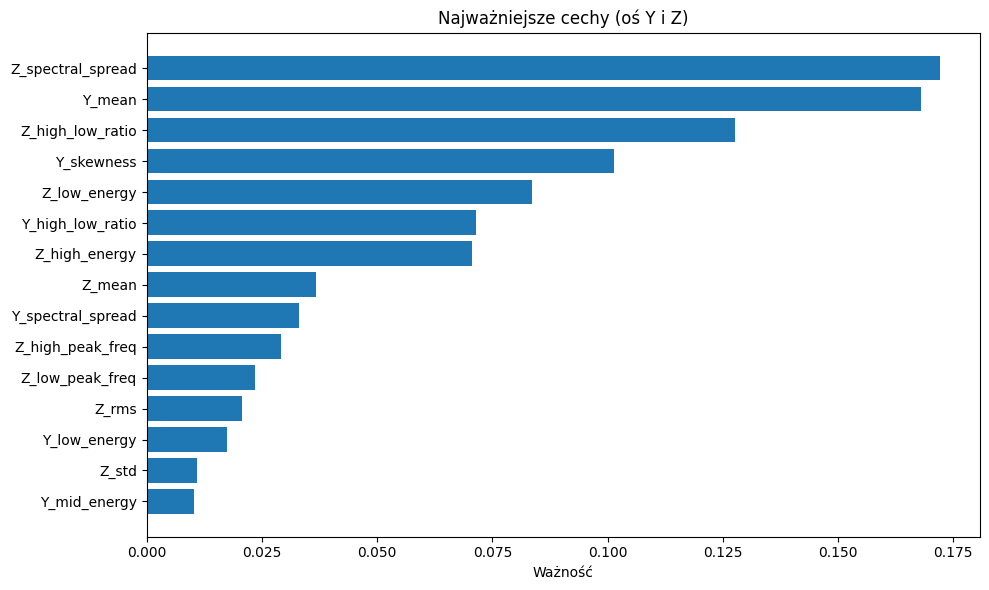


=== ZBIÓR TESTOWY (rep 5) ===

Wyniki na zbiorze testowym (16 próbek):
               precision    recall  f1-score   support

nieuszkodzone       1.00      1.00      1.00         8
   uszkodzone       1.00      1.00      1.00         8

     accuracy                           1.00        16
    macro avg       1.00      1.00      1.00        16
 weighted avg       1.00      1.00      1.00        16



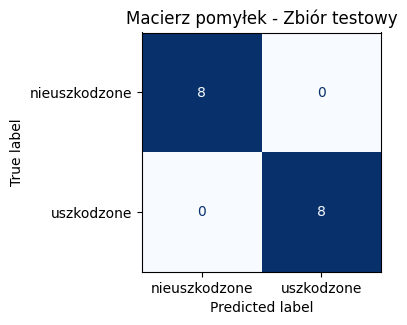


Analiza per PWM:
  PWM 20%: 1.000
  PWM 30%: 1.000
  PWM 40%: 1.000
  PWM 50%: 1.000

=== ZAPISYWANIE PROSTEGO MODELU ===
Zapisano prosty model do: model_simple_yz.pkl
Accuracy: 0.844
Liczba cech: 26


In [8]:
# Komórka 7 - Prosty klasyfikator z cechami Y i Z
from sklearn.model_selection import GroupKFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

print("=== PROSTY MODEL Z OSI Y i Z ===")

# Dane treningowe
meta_cols = ["file_id", "condition", "pwm", "rep", "part", "avg_rpm"]
feature_cols = [c for c in features_df.columns if c not in meta_cols]

print(f"Liczba cech: {len(feature_cols)}")

X_train = features_df[feature_cols].values
y_train = features_df["condition"].values
groups_pwm = features_df["pwm"].values

# Prosty model
simple_clf = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(
        n_estimators=100,           # Mniej drzew
        max_depth=5,                # Płytsze drzewa
        min_samples_split=10,       # Więcej próbek do podziału
        min_samples_leaf=5,         # Więcej próbek w liściach
        max_features='sqrt',        # Tylko sqrt cech
        random_state=42,
        n_jobs=-1
    ))
])

# Leave-one-PWM-out
unique_pwms = np.unique(groups_pwm)
gkf = GroupKFold(n_splits=len(unique_pwms))

scores = cross_val_score(
    simple_clf, X_train, y_train,
    cv=gkf, 
    groups=groups_pwm,
    scoring='accuracy',
    n_jobs=-1
)

print(f"\nLeave-one-PWM-out accuracy:")
print(f"  Średnia: {scores.mean():.3f} ± {scores.std():.3f}")
print(f"  Poszczególne: {scores}")

# Trenuj na wszystkich danych
simple_clf.fit(X_train, y_train)

# Ważność cech
rf_model = simple_clf.named_steps['rf']
importances = rf_model.feature_importances_

# Posortuj cechy
feature_importance = pd.DataFrame({
    'feature': feature_cols,
    'importance': importances
}).sort_values('importance', ascending=False)

print("\nTop 10 najważniejszych cech:")
print(feature_importance.head(10).to_string(index=False))

# Wizualizacja
plt.figure(figsize=(10, 6))
top_n = min(15, len(feature_importance))
plt.barh(range(top_n), feature_importance['importance'].head(top_n)[::-1])
plt.yticks(range(top_n), feature_importance['feature'].head(top_n)[::-1])
plt.xlabel('Ważność')
plt.title('Najważniejsze cechy (oś Y i Z)')
plt.tight_layout()
plt.show()

# === PRZYGOTOWANIE ZBIORU TESTOWEGO ===
print("\n=== ZBIÓR TESTOWY (rep 5) ===")

test_rows = []
test_subset = files_df[files_df["rep"] == 5].sort_values(
    ["condition", "pwm", "rep"]
)

for _, row in test_subset.iterrows():
    path = row["path"]
    cond = row["condition"]
    pwm = row["pwm"]
    rep = row["rep"]
    
    try:
        t, ax, ay, az, rpm_data, Fs = load_data_from_csv(path)
        t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh = \
            detect_steady_window(t, ax, ay, az)
        
        # RPM (jeśli dostępne)
        avg_rpm = None
        if rpm_data is not None:
            rpm_in_window = rpm_data[(t >= t_start) & (t <= t_end)]
            if len(rpm_in_window) > 0:
                avg_rpm = np.mean(rpm_in_window)
        
        N = len(ay_seg)
        if N < 100:
            continue
            
        mid = N // 2
        
        for part_idx in range(2):
            if part_idx == 0:
                ay_part = ay_seg[:mid]
                az_part = az_seg[:mid]
            else:
                ay_part = ay_seg[mid:]
                az_part = az_seg[mid:]
            
            # Ekstrakcja cech (te same funkcje!)
            features = {}
            
            y_features = extract_simple_features(ay_part, Fs, 'Y_')
            features.update(y_features)
            
            z_features = extract_simple_features(az_part, Fs, 'Z_')
            features.update(z_features)
            
            # Upewnij się że wszystkie cechy są obecne
            for feat in feature_cols:
                if feat not in features:
                    features[feat] = 0.0
            
            row_feat = {
                "file_id": str(path),
                "condition": cond,
                "pwm": pwm,
                "rep": rep,
                "part": part_idx,
                "avg_rpm": avg_rpm if avg_rpm is not None else np.nan,
            }
            row_feat.update(features)
            
            test_rows.append(row_feat)
            
    except Exception as e:
        print(f"Błąd: {path} - {e}")
        continue

features_test_df = pd.DataFrame(test_rows)

# Przygotuj dane testowe
X_test = features_test_df[feature_cols].values
y_test = features_test_df["condition"].values

# Predykcja
print(f"\nWyniki na zbiorze testowym ({len(y_test)} próbek):")
y_pred = simple_clf.predict(X_test)

print(classification_report(y_test, y_pred, 
                          target_names=["nieuszkodzone", "uszkodzone"]))

# Macierz pomyłek
cm_test = confusion_matrix(y_test, y_pred, 
                          labels=["nieuszkodzone", "uszkodzone"])
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test,
                                  display_labels=["nieuszkodzone", "uszkodzone"])
fig, ax = plt.subplots(figsize=(4,4))
disp_test.plot(ax=ax, cmap="Blues", colorbar=False)
plt.title("Macierz pomyłek - Zbiór testowy")
plt.tight_layout()
plt.show()

# Analiza per PWM
print("\nAnaliza per PWM:")
for pwm_val in sorted(features_test_df['pwm'].unique()):
    mask = features_test_df['pwm'] == pwm_val
    if np.sum(mask) > 0:
        X_pwm = X_test[mask]
        y_pwm = y_test[mask]
        y_pred_pwm = simple_clf.predict(X_pwm)
        
        accuracy = np.mean(y_pred_pwm == y_pwm)
        print(f"  PWM {pwm_val}%: {accuracy:.3f}")

# === ZAPISZ PROSTY MODEL ===
print("\n=== ZAPISYWANIE PROSTEGO MODELU ===")

import pickle

model_data = {
    'model': simple_clf,
    'features': feature_cols,
    'feature_importance': feature_importance.to_dict(),
    'accuracy': float(scores.mean()),
    'wavelet': BEST_WAVELET
}

with open('model_simple_yz.pkl', 'wb') as f:
    pickle.dump(model_data, f)

print("Zapisano prosty model do: model_simple_yz.pkl")
print(f"Accuracy: {scores.mean():.3f}")
print(f"Liczba cech: {len(feature_cols)}")

In [16]:
# Komórka 8 - Test modelu na nowym sygnale (kupione śmigło)
import pickle
import numpy as np
import pandas as pd
from pathlib import Path

print("=== TEST NA NOWYM SYGNALE (KUPIONE ŚMIGŁO) ===")

# 1. Załaduj zapisany model
with open('model_simple_yz.pkl', 'rb') as f:
    model_data = pickle.load(f)

simple_clf = model_data['model']
features = model_data['features']
print(f"Załadowano model z {len(features)} cechami")
print(f"Accuracy modelu: {model_data['accuracy']:.3f}")

# 2. Funkcja do wczytywania danych (bez RPM - dla nowych plików)
def load_data_simple_no_rpm(path):
    """Wczytuje dane bez RPM (dla plików z 4 kolumnami)."""
    df = pd.read_csv(path)
    cols_lower = {c.lower(): c for c in df.columns}
    
    # Znajdź kolumny
    time_col = None
    for key, orig in cols_lower.items():
        if "time" in key or "czas" in key:
            time_col = orig
            break
    
    x_col = y_col = z_col = None
    for key, orig in cols_lower.items():
        if x_col is None and key.startswith("x"):
            x_col = orig
        if y_col is None and key.startswith("y"):
            y_col = orig
        if z_col is None and key.startswith("z"):
            z_col = orig
    
    if time_col is None or x_col is None or y_col is None or z_col is None:
        raise ValueError(f"Nie mogę znaleźć kolumn w {path}")
    
    LSB_TO_G = 0.0039
    t = df[time_col].to_numpy()
    ax = df[x_col].to_numpy() * LSB_TO_G
    ay = df[y_col].to_numpy() * LSB_TO_G
    az = df[z_col].to_numpy() * LSB_TO_G
    
    dt = np.mean(np.diff(t))
    Fs = 1.0 / dt
    
    return t, ax, ay, az, Fs

# 3. Funkcje ekstrakcji cech (muszą być takie same jak w treningu!)
from scipy.stats import kurtosis, skew
from scipy.signal import welch
import pywt

BEST_WAVELET = "cmor3.5-1.0"

def compute_cwt_simple(y, Fs, fmin=0.5, fmax=400, n_freqs=128):
    """Uproszczone CWT - taka sama jak w treningu."""
    y = y - y.mean()
    
    dt = 1.0 / Fs
    freqs = np.linspace(fmin, fmax, n_freqs)
    scales = pywt.frequency2scale(BEST_WAVELET, freqs * dt)
    
    coeffs, _ = pywt.cwt(y, scales, BEST_WAVELET, sampling_period=dt)
    power = np.abs(coeffs)
    power_db = 20 * np.log10(power + 1e-12)
    
    return freqs, power_db

def extract_simple_features(signal, Fs, prefix=''):
    """Ekstrahuje cechy - taka sama jak w treningu."""
    features = {}
    
    if len(signal) < 100:
        return features
    
    # 1. Cechy czasowe
    features[f'{prefix}mean'] = np.mean(signal)
    features[f'{prefix}std'] = np.std(signal)
    features[f'{prefix}skewness'] = skew(signal)
    features[f'{prefix}kurtosis'] = kurtosis(signal)
    features[f'{prefix}rms'] = np.sqrt(np.mean(signal**2))
    
    # 2. Cechy częstotliwościowe (FFT)
    freqs, psd = welch(signal, Fs, nperseg=min(512, len(signal)//2))
    
    # Energia w 3 pasmach
    band_limits = [(0, 50, 'low'), (50, 150, 'mid'), (150, 300, 'high')]
    
    for f_low, f_high, band_name in band_limits:
        mask = (freqs >= f_low) & (freqs <= f_high)
        if np.any(mask):
            band_power = np.trapz(psd[mask], freqs[mask])
            features[f'{prefix}{band_name}_energy'] = band_power
            
            # Pik w paśmie
            peak_idx = np.argmax(psd[mask])
            features[f'{prefix}{band_name}_peak_freq'] = freqs[mask][peak_idx]
    
    # 3. Cechy CWT
    freqs_cwt, power_db = compute_cwt_simple(signal, Fs, n_freqs=128)
    
    # Stosunek energii wysokich do niskich częstotliwości
    mask_low = (freqs_cwt >= 0.5) & (freqs_cwt <= 50)
    mask_high = (freqs_cwt > 150) & (freqs_cwt <= 300)
    
    if np.any(mask_low) and np.any(mask_high):
        mean_spec = power_db.mean(axis=1)
        energy_low = np.mean(mean_spec[mask_low])
        energy_high = np.mean(mean_spec[mask_high])
        if energy_low != 0:
            features[f'{prefix}high_low_ratio'] = energy_high / energy_low
    
    # 4. Rozproszenie widmowe
    if np.sum(psd) > 0:
        centroid = np.sum(freqs * psd) / np.sum(psd)
        features[f'{prefix}spectral_spread'] = np.sqrt(
            np.sum((freqs - centroid)**2 * psd) / np.sum(psd)
        )
    
    return features

# 4. Funkcja detekcji okna (bez RPM)
def detect_steady_window_simple(t, ax, ay, az):
    """Detekcja okna - uproszczona."""
    mag = np.sqrt(ax**2 + ay**2 + az**2)
    
    # Parametry z treningu
    baseline_len_s = 0.5
    smooth_len_s = 0.05
    std_threshold = 3.0
    delay_after_jump = 1.0
    window_len_s = 12.0
    
    t0 = t[0]
    baseline_mask = t <= (t0 + baseline_len_s)
    baseline = mag[baseline_mask]
    mu = baseline.mean()
    sigma = baseline.std()
    thresh = mu + std_threshold * sigma
    
    dt = np.mean(np.diff(t))
    Fs = 1.0 / dt
    win_samples = int(round(smooth_len_s * Fs))
    if win_samples < 1:
        win_samples = 1
    kernel = np.ones(win_samples) / win_samples
    mag_smooth = np.convolve(mag, kernel, mode="same")
    
    idx_candidates = np.where(mag_smooth > thresh)[0]
    if len(idx_candidates) == 0:
        t_start = t0 + 1.0
    else:
        idx_event = idx_candidates[0]
        t_event = t[idx_event]
        t_start = t_event + delay_after_jump
    
    t_end = t_start + window_len_s
    if t_end > t[-1]:
        t_end = t[-1]
        t_start = t_end - window_len_s
        if t_start < t0:
            t_start = t0
    
    mask_seg = (t >= t_start) & (t <= t_end)
    
    return (t[mask_seg],
            ax[mask_seg],
            ay[mask_seg],
            az[mask_seg],
            (t_start, t_end),
            mag,
            mag_smooth,
            thresh)

# 5. Test na Twoim pliku
test_file = Path("data") / "pomiary_finalne" / "kupione_smiglo" / "pwm_20%" / "3_kupione_20%.csv"
print(f"\nTestowany plik: {test_file}")

try:
    # Wczytaj dane (bez RPM)
    t, ax, ay, az, Fs = load_data_simple_no_rpm(test_file)
    print(f"Wczytano: {len(t)} próbek, Fs={Fs:.0f} Hz")
    
    # Detekcja okna
    t_seg, ax_seg, ay_seg, az_seg, (t_start, t_end), mag, mag_smooth, thresh = \
        detect_steady_window_simple(t, ax, ay, az)
    
    print(f"Okno pracy: {t_start:.1f}-{t_end:.1f}s ({len(ay_seg)} próbek)")
    
    # Podziel na 2 połówki
    N = len(ay_seg)
    if N < 100:
        print("Błąd: Za krótki sygnał w oknie pracy")
    else:
        mid = N // 2
        predictions = []
        probabilities = []
        
        for part_idx in range(2):
            # Wybierz połówkę
            if part_idx == 0:
                ay_part = ay_seg[:mid]
                az_part = az_seg[:mid]
            else:
                ay_part = ay_seg[mid:]
                az_part = az_seg[mid:]
            
            # Ekstrakcja cech
            features_dict = {}
            
            # Oś Y
            y_features = extract_simple_features(ay_part, Fs, 'Y_')
            features_dict.update(y_features)
            
            # Oś Z
            z_features = extract_simple_features(az_part, Fs, 'Z_')
            features_dict.update(z_features)
            
            # Upewnij się że wszystkie cechy są obecne
            X_vector = []
            for feat in features:
                if feat in features_dict:
                    X_vector.append(features_dict[feat])
                else:
                    X_vector.append(0.0)  # Domyślna wartość
            
            X = np.array([X_vector])
            
            # Predykcja
            pred = simple_clf.predict(X)[0]
            proba = simple_clf.predict_proba(X)[0]
            
            predictions.append(pred)
            probabilities.append(proba)
            
            print(f"  Połówka {part_idx+1}: {pred}")
            print(f"    Prawdopodobieństwa: {proba}")
        
        # Głosowanie większościowe
        final_pred = max(set(predictions), key=predictions.count)
        prob_damaged = np.mean([p[1] if simple_clf.classes_[1] == 'uszkodzone' else p[0] 
                                for p in probabilities])
        
        print(f"\n{'='*60}")
        print(f"WYNIK: {final_pred}")
        print(f"Prawdopodobieństwo uszkodzenia: {prob_damaged:.3f}")
        print(f"{'='*60}")
        
        if final_pred == 'uszkodzone':
            print("\n⚠️  WYKRYTO USZKODZENIE ŚMIGŁA!")
        else:
            print("\n✓ ŚMIGŁO NIEUSZKODZONE")
        
        # Dodatkowa analiza
        print("\nAnaliza głównych cech:")
        top_features = ['Z_spectral_spread', 'Y_mean', 'Z_high_low_ratio', 'Y_skewness']
        
        for feat in top_features:
            if feat in features_dict:
                val = features_dict[feat]
                # Pobierz średnie z treningu
                if hasattr(features_df, 'columns') and feat in features_df.columns:
                    mean_ok = features_df[features_df['condition']=='nieuszkodzone'][feat].mean()
                    mean_dmg = features_df[features_df['condition']=='uszkodzone'][feat].mean()
                    
                    dist_to_ok = abs(val - mean_ok) / features_df[feat].std()
                    dist_to_dmg = abs(val - mean_dmg) / features_df[feat].std()
                    
                    print(f"  {feat}: {val:.4f}")
                    print(f"    Odl. do OK: {dist_to_ok:.2f}σ, do DMG: {dist_to_dmg:.2f}σ")
                    
except FileNotFoundError:
    print(f"\nBŁĄD: Nie znaleziono pliku {test_file}")
    print("Sprawdź ścieżkę lub uruchom z innym plikiem:")
    print("""
    # Uruchom z innym plikiem:
    test_file = "twoja_sciezka.csv"
    """)
    
except Exception as e:
    print(f"\nBŁĄD: {e}")
    import traceback
    traceback.print_exc()

=== TEST NA NOWYM SYGNALE (KUPIONE ŚMIGŁO) ===
Załadowano model z 26 cechami
Accuracy modelu: 0.844

Testowany plik: data\pomiary_finalne\kupione_smiglo\pwm_20%\3_kupione_20%.csv
Wczytano: 30693 próbek, Fs=1600 Hz
Okno pracy: 2.3-14.3s (19201 próbek)
  Połówka 1: uszkodzone
    Prawdopodobieństwa: [0.39327489 0.60672511]
  Połówka 2: uszkodzone
    Prawdopodobieństwa: [0.4110487 0.5889513]

WYNIK: uszkodzone
Prawdopodobieństwo uszkodzenia: 0.598

⚠️  WYKRYTO USZKODZENIE ŚMIGŁA!

Analiza głównych cech:
  Z_spectral_spread: 143.5354
    Odl. do OK: 0.28σ, do DMG: 1.80σ
  Y_mean: -0.0283
    Odl. do OK: 0.96σ, do DMG: 0.87σ
  Z_high_low_ratio: 0.8547
    Odl. do OK: 2.44σ, do DMG: 0.86σ
  Y_skewness: 0.1356
    Odl. do OK: 2.15σ, do DMG: 0.70σ
